<a href="https://colab.research.google.com/github/DenisDrobyshev/universum/blob/master/%D0%9F%D1%80%D0%B0%D0%BA%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B0%D1%8F_%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%B0_7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Практическая работа №7. Использование автоэнкодера U-Net для решения задач семантической сегментации**

---

## **Задание №1. Обучение готовой модели семантической сегментации для классификации спутниковых снимков**

### **Раздел 1. Теоретические основы**

#### **1.1. Семантическая сегментация в геоанализе**

Семантическая сегментация - процесс разделения изображения на семантически значимые области, где каждому пикселю присваивается метка класса. В контексте геоанализа это позволяет автоматически выделять на спутниковых снимках здания, дороги, водные объекты, растительность и т.д.

#### **1.2. Архитектура U-Net**

U-Net - сверточная нейронная сеть, изначально разработанная для сегментации биомедицинских изображений, но успешно адаптированная для геоанализа. Название происходит от U-образной формы архитектуры.

Основные компоненты:

1. **Энкодер (downsampling)** - последовательность свёрточных слоёв с max-pooling для извлечения признаков.
2. **Декодер (upsampling)** - восстановление пространственного разрешения.
3. **Skip-connections** - обходные соединения между уровнями энкодера и декодера, передающие детализированную пространственную информацию.

### **Раздел 2. Подготовка данных**

#### **2.1. Загрузка и первичное знакомство с данными**

В качестве набора данных используется [LandCover.ai v1](https://landcover.ai.linuxpolska.com/#dataset) - аэрофотоснимки с пятью классами поверхности:

- 0: background (фон)
- 1: building (здания)
- 2: woodland (лесная растительность)
- 3: water (вода)
- 4: road (дороги)

Изображения хранятся в формате TIFF, маски представлены одноканальными grayscale изображениями, где значение пикселя напрямую соответствует индексу класса.

Скачиваем и распаковываем набор в рабочую директорию:

#### **2.2. Установка необходимых библиотек**

In [ ]:
import os
import glob
import random
import time
import numpy as np
import cv2
import pandas as pd
import pickle

from PIL import Image
from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap
from imutils.paths import list_images

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model

os.environ['SM_FRAMEWORK'] = 'tf.keras'
import segmentation_models as sm
from segmentation_models.losses import DiceLoss, JaccardLoss, CategoricalFocalLoss

from sklearn.metrics import confusion_matrix, cohen_kappa_score
import seaborn as sns

Segmentation Models: using `tf.keras` framework.


#### **2.3. Определение параметров эксперимента**

Задаём основные гиперпараметры и описание классов датасета LandCover.ai:

In [ ]:
ROOT_DIR   = "landcover.ai.v1/"

PATCH_SIZE = 256
BATCH_SIZE = 32
VAL_SPLIT  = 0.2
SEED       = 42
N_CLASSES  = 5         # background, building, woodland, water, road
BACKBONE   = "resnet34"
AUTOTUNE   = tf.data.AUTOTUNE

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

preprocess_input = sm.get_preprocessing(BACKBONE)

# Цветовая палитра для визуализации классов
CLASS_COLORS = np.array([
    [0,   0,   0  ],  # 0: background - черный
    [255, 0,   0  ],  # 1: building   - красный
    [0,   128, 0  ],  # 2: woodland   - зеленый
    [0,   0,   255],  # 3: water      - синий
    [139, 69,  19 ],  # 4: road       - коричневый
], dtype=np.uint8)

CLASS_NAMES = ["background", "building", "woodland", "water", "road"]

# Игнорируемый класс при расчёте метрик (в LandCover.ai отсутствует, но
# выставим индекс вне диапазона, чтобы фильтрация ничего не отбрасывала)
IGNORE_CLASS = -1

CLASS_COLORS_TF = tf.constant(CLASS_COLORS, dtype=tf.uint8)

Проанализируем содержимое одной из масок - какие значения в ней встречаются:

In [ ]:
mask_files = list(list_images(f"{ROOT_DIR}masks"))
sample_mask = cv2.imread(mask_files[0], cv2.IMREAD_GRAYSCALE)
s = pd.Series(sample_mask.ravel())
print("Распределение классов в маске:")
print(s.value_counts().sort_index())
print(f"\nРазмер маски: {sample_mask.shape}")
print(f"Уникальные значения: {np.unique(sample_mask)}")

Распределение классов в маске:
0    18008335
1       46512
2    59476087
3     9553859
4      554627
dtype: int64

Размер маски: (9636, 9095)
Уникальные значения: [0 1 2 3 4]


---

#### **2.4. Сбор путей к изображениям и маскам**

Функция для сбора путей к изображениям и маскам датасета LandCover.ai. Работаем напрямую с исходной структурой, без создания промежуточных папок с патчами.

In [ ]:
def collect_file_paths(root_dir):
    """
    Собирает пути к изображениям и маскам LandCover.ai.
    Для каждого изображения ищется соответствующая маска с тем же именем.
    """
    image_paths = sorted(list(list_images(f"{root_dir}images")))
    mask_paths = []
    valid_images = []

    for img_path in image_paths:
        name = os.path.splitext(os.path.basename(img_path))[0]
        mask_path = os.path.join(root_dir, "masks", name + ".tif")
        if os.path.exists(mask_path):
            valid_images.append(img_path)
            mask_paths.append(mask_path)

    return valid_images, mask_paths


all_image_paths, all_mask_paths = collect_file_paths(ROOT_DIR)

print(f"Найдено изображений: {len(all_image_paths)}")
print(f"Найдено масок:       {len(all_mask_paths)}")
print(f"\nПримеры путей:")
for i in range(min(3, len(all_image_paths))):
    print(f"  IMG:  {all_image_paths[i]}")
    print(f"  MASK: {all_mask_paths[i]}")

Найдено изображений: 41
Найдено масок:       41

Примеры путей:
  IMG:  landcover.ai.v1/images\M-33-20-D-c-4-2.tif
  MASK: landcover.ai.v1/masks\M-33-20-D-c-4-2.tif
  IMG:  landcover.ai.v1/images\M-33-20-D-d-3-3.tif
  MASK: landcover.ai.v1/masks\M-33-20-D-d-3-3.tif
  IMG:  landcover.ai.v1/images\M-33-32-B-b-4-4.tif
  MASK: landcover.ai.v1/masks\M-33-32-B-b-4-4.tif


---

#### **2.5. Визуальный осмотр примеров**

In [ ]:
def visualize_samples(image_paths, mask_paths, num_samples=3):
    """Визуализирует случайные пары изображение-маска с подписью классов."""
    indices = random.sample(range(len(image_paths)), min(num_samples, len(image_paths)))

    cmap = ListedColormap([
        "#000000",  # background
        "#FF0000",  # building
        "#008000",  # woodland
        "#0000FF",  # water
        "#8B4513",  # road
    ])

    class_labels = [
        "background (0)",
        "building (1)",
        "woodland (2)",
        "water (3)",
        "road (4)",
    ]

    for idx in indices:
        img = cv2.cvtColor(cv2.imread(image_paths[idx]), cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_paths[idx], cv2.IMREAD_GRAYSCALE)

        print(f"Файл: {os.path.basename(image_paths[idx])}")
        print(f"Размер изображения: {img.shape}, размер маски: {mask.shape}")
        print(f"Уникальные значения в маске: {np.unique(mask)}")

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        axes[0].imshow(img)
        axes[0].set_title("Изображение")
        axes[0].axis("off")

        im = axes[1].imshow(mask, cmap=cmap, vmin=0, vmax=4)
        axes[1].set_title("Маска (классы)")
        axes[1].axis("off")

        cbar = plt.colorbar(im, ax=axes[1], ticks=range(5))
        cbar.ax.set_yticklabels(class_labels)
        cbar.set_label("Классы")

        plt.tight_layout()
        plt.show()

Файл: N-34-97-D-c-2-4.tif
Размер изображения: (4672, 4230, 3), размер маски: (4672, 4230)
Уникальные значения в маске: [0 1 2 3 4]


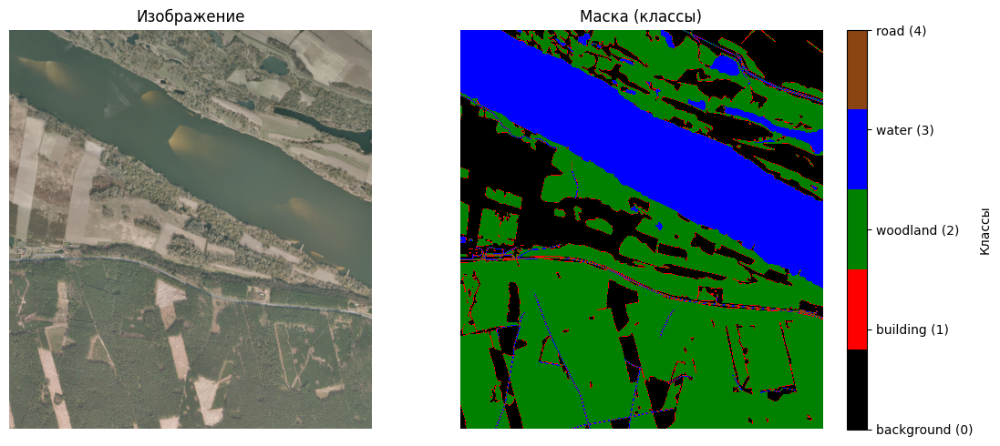

Файл: M-34-32-B-b-1-3.tif
Размер изображения: (9607, 9075, 3), размер маски: (9607, 9075)
Уникальные значения в маске: [0 1 2 3 4]


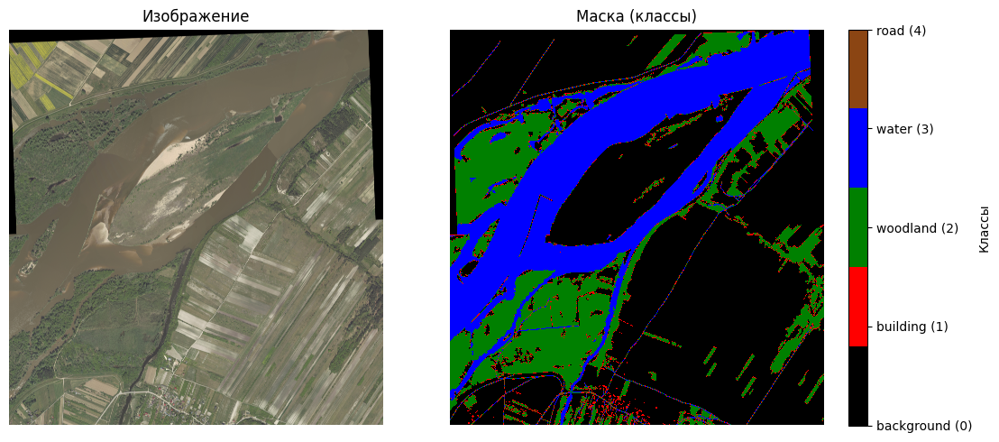

Файл: M-33-20-D-d-3-3.tif
Размер изображения: (9631, 9095, 3), размер маски: (9631, 9095)
Уникальные значения в маске: [0 1 2 3 4]


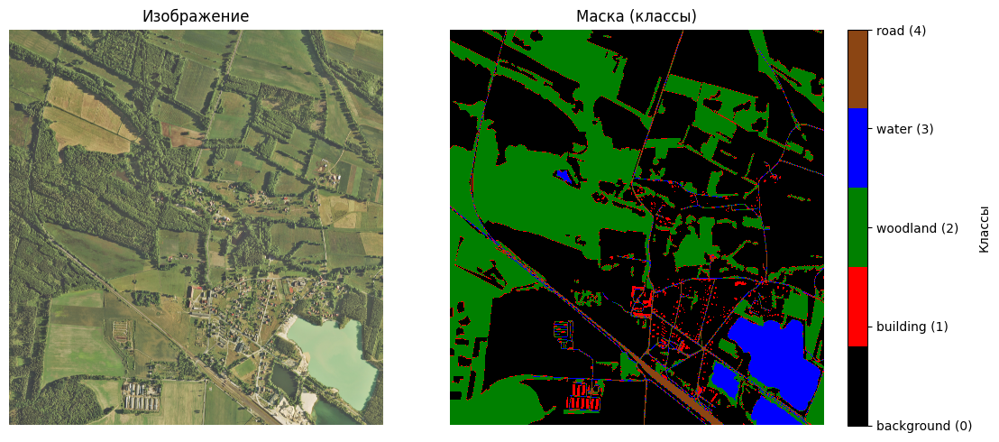

In [ ]:
visualize_samples(all_image_paths, all_mask_paths, num_samples=3)

#### **2.6. Разбиение на обучающую и валидационную выборки**

In [ ]:
def split_train_val(image_paths, mask_paths, val_split=0.2, seed=42):
    """
    Простое случайное разбиение на обучающую и валидационную выборки.
    Датасет LandCover.ai содержит 41 независимую сцену без группировки,
    поэтому стратификация не требуется.
    """
    n = len(image_paths)
    indices = np.arange(n)
    np.random.seed(seed)
    np.random.shuffle(indices)

    split_idx = int(n * (1 - val_split))

    train_imgs = [image_paths[i] for i in indices[:split_idx]]
    train_msks = [mask_paths[i]  for i in indices[:split_idx]]
    val_imgs   = [image_paths[i] for i in indices[split_idx:]]
    val_msks   = [mask_paths[i]  for i in indices[split_idx:]]

    return train_imgs, train_msks, val_imgs, val_msks


train_img_paths, train_mask_paths, val_img_paths, val_mask_paths = split_train_val(
    all_image_paths,
    all_mask_paths,
    val_split=VAL_SPLIT,
    seed=SEED
)

print(f"Итого:")
print(f"  Train: {len(train_img_paths)} изображений")
print(f"  Val:   {len(val_img_paths)} изображений")

Итого:
  Train: 32 изображений
  Val:   9 изображений


---

#### **2.7. Подсчёт ожидаемого количества патчей**

Так как разбиение на патчи выполняется «на лету», заранее оценим количество патчей для контроля пайплайна и настройки буфера shuffle:

In [ ]:
def count_patches(image_paths, patch_size=256):
    """Подсчитывает общее количество патчей."""
    total = 0
    for path in image_paths:
        with Image.open(path) as img:
            w, h = img.size
        n_h = h // patch_size
        n_w = w // patch_size
        total += n_h * n_w
    return total

In [ ]:
num_train_patches = count_patches(train_img_paths, PATCH_SIZE)
num_val_patches = count_patches(val_img_paths, PATCH_SIZE)

print(f"Обучающих патчей:     {num_train_patches}")
print(f"Валидационных патчей: {num_val_patches}")

Обучающих патчей:     34715
Валидационных патчей: 9407


---

### **Раздел 3. Предобработка данных и формирование tf.data-пайплайна**

#### **3.1. Преобразование масок в индексы классов**

In [ ]:
def mask_to_2D_label(mask):
    """
    Приводит маску к карте классов формы (H, W).
    Для LandCover.ai маска уже содержит индексы классов в одном канале.
    """
    mask = tf.cast(mask, tf.int32)
    if len(mask.shape) == 3:
        # На случай, если вдруг попали 3 канала - берём первый
        mask = mask[:, :, 0]
    return mask


def label_to_rgb(label):
    """Преобразует карту классов (H, W) в RGB (H, W, 3) по палитре CLASS_COLORS."""
    return CLASS_COLORS[label]

---

#### **3.2. Функции загрузки и проверки данных**

In [ ]:
def _read_tiff_image(path_bytes):
    """Читает TIFF-изображение через cv2 (возвращает RGB uint8, 3 канала)."""
    path = path_bytes.numpy().decode('utf-8')
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img.astype(np.uint8)


def _read_tiff_mask(path_bytes):
    """Читает TIFF-маску через cv2 (grayscale, 1 канал)."""
    path = path_bytes.numpy().decode('utf-8')
    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    return mask[:, :, np.newaxis].astype(np.uint8)


def load_pair(img_path, mask_path):
    """
    Загружает TIFF-изображение и TIFF-маску через cv2 (tf.py_function).
    tf.io.decode_image не поддерживает TIFF - поэтому используем cv2.
    """
    img = tf.py_function(
        func=_read_tiff_image,
        inp=[img_path],
        Tout=tf.uint8
    )
    img.set_shape([None, None, 3])

    mask = tf.py_function(
        func=_read_tiff_mask,
        inp=[mask_path],
        Tout=tf.uint8
    )
    mask.set_shape([None, None, 1])

    return img, mask


def check_shapes(img, mask):
    """Проверяет совпадение пространственных размеров изображения и маски."""
    tf.debugging.assert_equal(
        tf.shape(img)[:2], tf.shape(mask)[:2],
        message="Размеры изображения и маски не совпадают"
    )
    return img, mask

---

#### **3.3. Извлечение патчей с помощью tf.image.extract_patches**

In [ ]:
def extract_patches(img, mask, patch_size=256):
    """
    Извлекает непересекающиеся патчи из изображения и маски.
    Возвращает tf.data.Dataset с парами патчей.
    """
    # Обрезаем до размера, кратного patch_size
    h = (tf.shape(img)[0] // patch_size) * patch_size
    w = (tf.shape(img)[1] // patch_size) * patch_size

    img = img[:h, :w, :]
    mask = mask[:h, :w, :]

    img_patches = tf.image.extract_patches(
        images=tf.cast(img[None, ...], tf.float32),
        sizes=[1, patch_size, patch_size, 1],
        strides=[1, patch_size, patch_size, 1],
        rates=[1, 1, 1, 1],
        padding="VALID"
    )

    mask_patches = tf.image.extract_patches(
        images=tf.cast(mask[None, ...], tf.float32),
        sizes=[1, patch_size, patch_size, 1],
        strides=[1, patch_size, patch_size, 1],
        rates=[1, 1, 1, 1],
        padding="VALID"
    )

    img_patches = tf.cast(tf.reshape(img_patches, [-1, patch_size, patch_size, 3]), tf.uint8)
    mask_patches = tf.cast(tf.reshape(mask_patches, [-1, patch_size, patch_size, 1]), tf.uint8)

    return tf.data.Dataset.from_tensor_slices((img_patches, mask_patches))

---

#### **3.4. Синхронная аугментация**

In [ ]:
def augment(img, mask):
    """Синхронная аугментация (отражения по горизонтали и вертикали)."""
    seed_lr = tf.random.uniform([2], maxval=1_000_000, dtype=tf.int32)
    seed_ud = tf.random.uniform([2], maxval=1_000_000, dtype=tf.int32)

    img = tf.image.stateless_random_flip_left_right(img, seed_lr)
    mask = tf.image.stateless_random_flip_left_right(mask, seed_lr)

    img = tf.image.stateless_random_flip_up_down(img, seed_ud)
    mask = tf.image.stateless_random_flip_up_down(mask, seed_ud)

    return img, mask

---

#### **3.5. Предобработка изображений и масок**

Для изображения используем функцию предобработки из `segmentation_models` (соответствует ResNet34). Маска LandCover.ai уже содержит индексы классов - её нужно только перевести в one-hot-формат.

In [ ]:
def preprocess(img, mask):
    """Предобработка изображения и маски."""

    def _preprocess_np(img_np, mask_np):
        img_out = preprocess_input(img_np.numpy().astype(np.float32))
        label = mask_np.numpy().astype(np.int32).squeeze(-1)  # (H, W)
        # Защита от выхода за пределы количества классов
        label = np.clip(label, 0, N_CLASSES - 1)
        mask_out = np.eye(N_CLASSES, dtype=np.float32)[label]
        return img_out, mask_out

    img, mask = tf.py_function(
        func=_preprocess_np,
        inp=[img, mask],
        Tout=[tf.float32, tf.float32]
    )

    img.set_shape([PATCH_SIZE, PATCH_SIZE, 3])
    mask.set_shape([PATCH_SIZE, PATCH_SIZE, N_CLASSES])

    return img, mask

#### **3.6. Создание оптимизированного tf.data-пайплайна**

In [ ]:
def create_dataset(image_paths, mask_paths, batch_size, is_training=True,
                   expected_patches=None, seed=42):
    """
    Создаёт оптимизированный tf.data.Dataset.

    Этапы:
    1. Загрузка изображений и масок
    2. Проверка размеров
    3. Извлечение патчей (flat_map)
    4. Shuffle + Augmentation (для train)
    5. Предобработка
    6. Batching + Prefetch
    """
    ds = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))

    ds = ds.map(load_pair, num_parallel_calls=AUTOTUNE)
    ds = ds.map(check_shapes, num_parallel_calls=AUTOTUNE)

    ds = ds.flat_map(lambda img, mask: extract_patches(img, mask, PATCH_SIZE))

    if expected_patches is not None:
        ds = ds.apply(tf.data.experimental.assert_cardinality(expected_patches))

    # Кэширование сырых патчей (осторожно - нужно достаточно ОЗУ)
    # Если памяти мало, закомментируйте следующую строку
    # ds = ds.cache()

    if is_training:
        ds = ds.shuffle(buffer_size=min(2048, expected_patches or 1024),
                       seed=seed, reshuffle_each_iteration=True)
        ds = ds.map(augment, num_parallel_calls=AUTOTUNE)

    ds = ds.map(preprocess, num_parallel_calls=AUTOTUNE)

    ds = ds.batch(batch_size)
    ds = ds.prefetch(AUTOTUNE)

    return ds


train_ds = create_dataset(
    train_img_paths, train_mask_paths,
    batch_size=BATCH_SIZE,
    is_training=True,
    expected_patches=num_train_patches,
    seed=SEED
)

val_ds = create_dataset(
    val_img_paths, val_mask_paths,
    batch_size=BATCH_SIZE,
    is_training=False,
    expected_patches=num_val_patches,
    seed=SEED
)

NameError: name 'num_train_patches' is not defined

#### **3.7. Проверка содержимого датасетов**


Проверка: Обучающая выборка
Форма батча изображений: (32, 256, 256, 3)
Форма батча масок:       (32, 256, 256, 5)
Тип изображений:         <dtype: 'float32'>
Тип масок:               <dtype: 'float32'>
Диапазон изображений:    [21.000, 255.000]


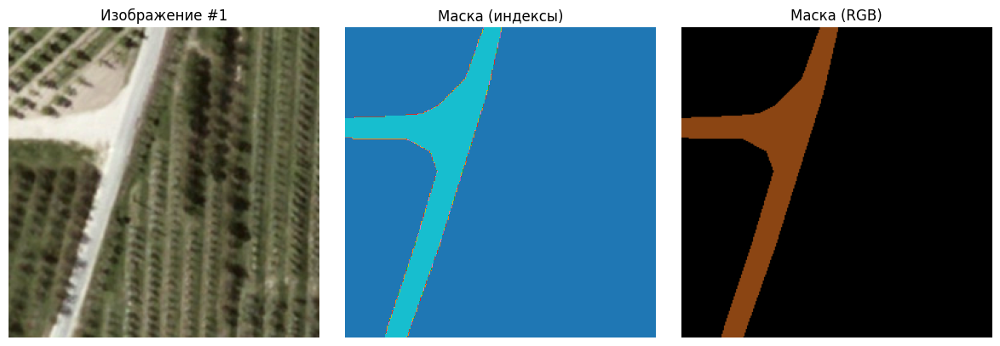

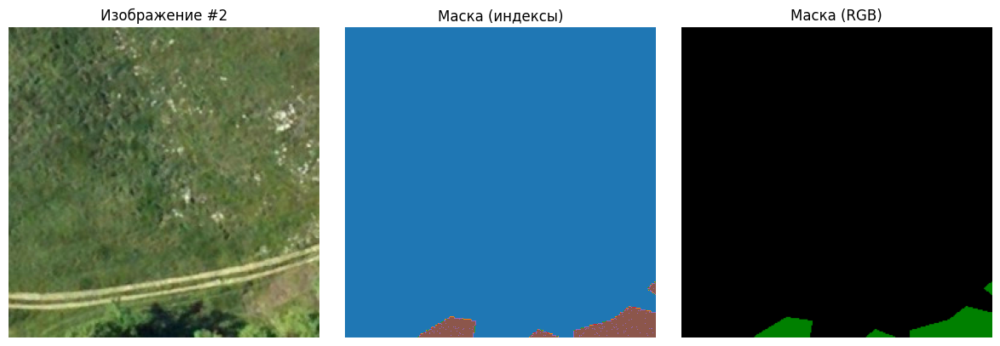

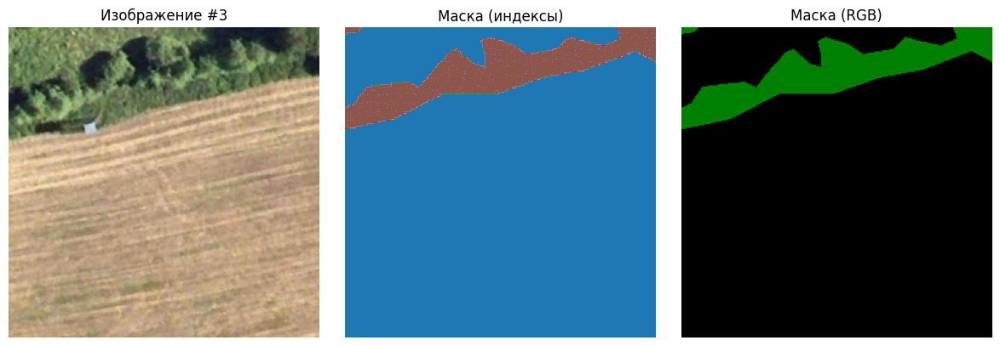


Проверка: Валидационная выборка
Форма батча изображений: (32, 256, 256, 3)
Форма батча масок:       (32, 256, 256, 5)
Тип изображений:         <dtype: 'float32'>
Тип масок:               <dtype: 'float32'>
Диапазон изображений:    [0.000, 252.000]


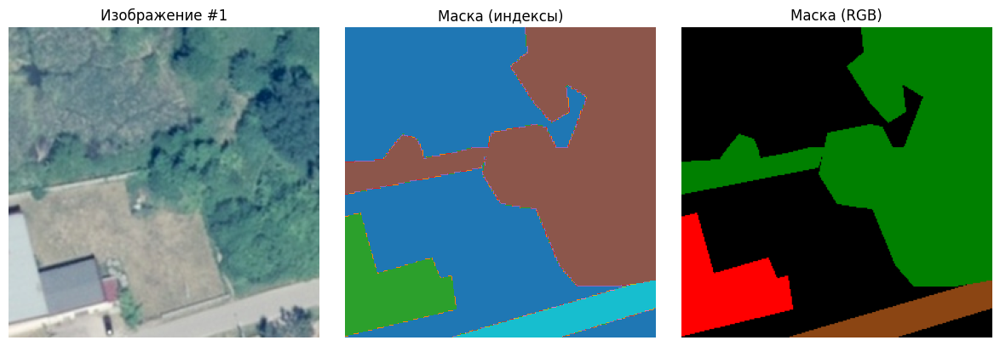

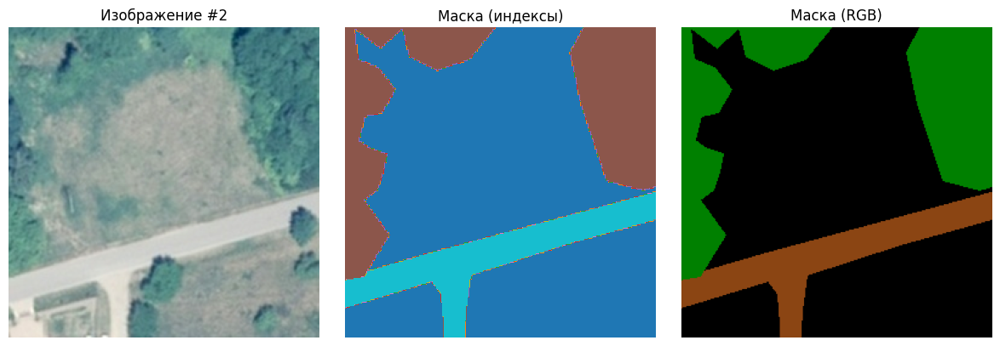


ИТОГОВАЯ СТАТИСТИКА
Обучающих изображений:     32
Обучающих патчей:          34715
Валидационных изображений: 9
Валидационных патчей:      9407

Размер патча: 256x256
Размер батча: 32
Классов:      5


In [ ]:
def check_dataset(ds, name, num_samples=3):
    """Проверяет датасет: размерности, типы, визуализация примеров."""
    print(f"\n{'='*50}")
    print(f"Проверка: {name}")
    print(f"{'='*50}")

    for images, masks in ds.take(1):
        print(f"Форма батча изображений: {images.shape}")
        print(f"Форма батча масок:       {masks.shape}")
        print(f"Тип изображений:         {images.dtype}")
        print(f"Тип масок:               {masks.dtype}")
        print(f"Диапазон изображений:    [{tf.reduce_min(images):.3f}, {tf.reduce_max(images):.3f}]")

        for i in range(min(num_samples, images.shape[0])):
            fig, axes = plt.subplots(1, 3, figsize=(12, 4))

            img = images[i].numpy()
            img = (img - img.min()) / (img.max() - img.min() + 1e-8)

            axes[0].imshow(img)
            axes[0].set_title(f"Изображение #{i+1}")
            axes[0].axis("off")

            mask_idx = tf.argmax(masks[i], axis=-1).numpy()
            axes[1].imshow(mask_idx, cmap='tab10', vmin=0, vmax=N_CLASSES - 1)
            axes[1].set_title("Маска (индексы)")
            axes[1].axis("off")

            mask_rgb = label_to_rgb(mask_idx)
            axes[2].imshow(mask_rgb)
            axes[2].set_title("Маска (RGB)")
            axes[2].axis("off")

            plt.tight_layout()
            plt.show()


check_dataset(train_ds, "Обучающая выборка", num_samples=3)
check_dataset(val_ds, "Валидационная выборка", num_samples=2)

print(f"\n{'='*50}")
print("ИТОГОВАЯ СТАТИСТИКА")
print(f"{'='*50}")
print(f"Обучающих изображений:     {len(train_img_paths)}")
print(f"Обучающих патчей:          {num_train_patches}")
print(f"Валидационных изображений: {len(val_img_paths)}")
print(f"Валидационных патчей:      {num_val_patches}")
print(f"\nРазмер патча: {PATCH_SIZE}x{PATCH_SIZE}")
print(f"Размер батча: {BATCH_SIZE}")
print(f"Классов:      {N_CLASSES}")

---

### **Раздел 4. Построение архитектуры и обучение модели**

#### **4.1. Определение метрик**

In [ ]:
def jacard_coef(y_true, y_pred):
    """Коэффициент Жаккара (IoU) как метрика Keras."""
    y_true_f = K.flatten(K.cast(y_true, 'float32'))
    y_pred_f = K.flatten(K.cast(y_pred, 'float32'))
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)


# Встроенные метрики из segmentation_models
iou_score = sm.metrics.IOUScore(threshold=0.5)
f1_score = sm.metrics.FScore(threshold=0.5)

---

#### **4.2. Инициализация модели U-Net**

Для построения U-Net используем библиотеку `segmentation_models` с энкодером ResNet34 и предобученными на ImageNet весами:

In [ ]:
model = sm.Unet(
    BACKBONE,
    encoder_weights='imagenet',
    classes=N_CLASSES,
    activation='softmax',
    input_shape=(PATCH_SIZE, PATCH_SIZE, 3)
)

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 bn_data (BatchNormalization)   (None, 256, 256, 3)  9           ['data[0][0]']                   
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0          ['bn_data[0][0]']                
                                                                                                  
 conv0 (Conv2D)                 (None, 128, 128, 64  9408        ['zero_padding2d[0][0]']   

---

#### **4.3. Компиляция модели**

Для задачи многоклассовой сегментации используем DiceLoss из `segmentation_models`:

In [ ]:
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=DiceLoss(),
    metrics=['accuracy', jacard_coef, iou_score, f1_score]
)

---

#### **4.4. Обучение модели с колбэками**

In [ ]:
callbacks = [
    EarlyStopping(
        monitor='val_jacard_coef',
        patience=10,
        restore_best_weights=True,
        mode='max',
        verbose=1
    ),
    ModelCheckpoint(
        filepath='best_model.h5',
        monitor='val_jacard_coef',
        save_best_only=True,
        mode='max',
        verbose=1
    )
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/50
272/272 [==============================] - ETA: 0s - loss: 0.5772 - accuracy: 0.8103 - jacard_coef: 0.5008 - iou_score: 0.4541 - f1-score: 0.5519
Epoch 1: val_jacard_coef improved from -inf to 0.55568, saving model to best_model.h5
272/272 [==============================] - 398s 1s/step - loss: 0.5772 - accuracy: 0.8103 - jacard_coef: 0.5008 - iou_score: 0.4541 - f1-score: 0.5519 - val_loss: 0.6135 - val_accuracy: 0.8580 - val_jacard_coef: 0.5557 - val_iou_score: 0.5169 - val_f1-score: 0.6236
Epoch 2/50
272/272 [==============================] - ETA: 0s - loss: 0.3034 - accuracy: 0.8807 - jacard_coef: 0.7604 - iou_score: 0.6486 - f1-score: 0.7673
Epoch 2: val_jacard_coef improved from 0.55568 to 0.71926, saving model to best_model.h5
272/272 [==============================] - 388s 1s/step - loss: 0.3034 - accuracy: 0.8807 - jacard_coef: 0.7604 - iou_score: 0.6486 - f1-score: 0.7673 - val_loss: 0.4223 - val_accuracy: 0.8340 - val_jacard_coef: 0.7193 - val_iou_score: 0.5488 - 

---

In [ ]:
with open("unet_history.pickle", "wb") as f:
    pickle.dump(history.history, f)

### **Раздел 5. Анализ результатов и визуализация**

#### **5.1. Визуализация процесса обучения**

In [ ]:
history = None
with open("unet_history.pickle", "rb") as f:
    history = pickle.load(f)

In [ ]:
def plot_history(history):
    """Строит графики loss и IoU на обучении и валидации."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].plot(history['loss'], label='Train')
    axes[0].plot(history['val_loss'], label='Val')
    axes[0].set_title('Loss (DiceLoss)')
    axes[0].set_xlabel('Эпоха')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(history['jacard_coef'], label='Train')
    axes[1].plot(history['val_jacard_coef'], label='Val')
    axes[1].set_title('Jaccard (IoU)')
    axes[1].set_xlabel('Эпоха')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

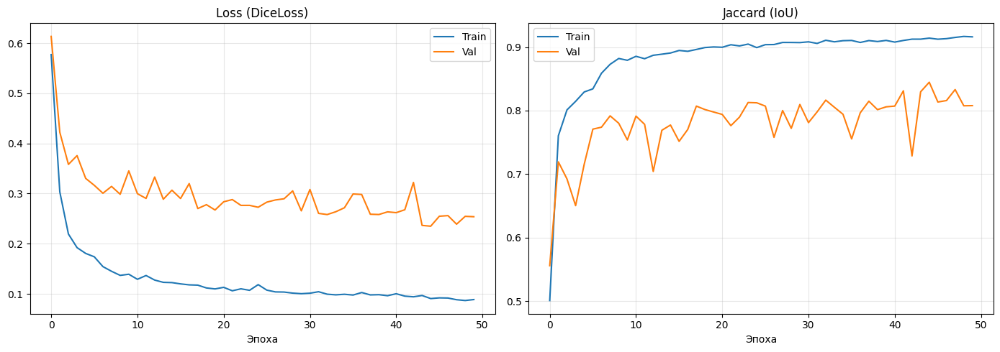

In [ ]:
plot_history(history)

#### **5.2. Визуализация предсказаний на валидационных патчах**

In [ ]:
def visualize_predictions(model, dataset, num_samples=5):
    """Визуализация предсказаний модели на патчах."""
    for images, masks in dataset.take(1):
        preds = model.predict(images, verbose=0)

        for i in range(min(num_samples, images.shape[0])):
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))

            img = images[i].numpy()
            img = (img - img.min()) / (img.max() - img.min() + 1e-8)

            axes[0].imshow(img)
            axes[0].set_title("Изображение")
            axes[0].axis("off")

            true_mask = label_to_rgb(np.argmax(masks[i], axis=-1))
            axes[1].imshow(true_mask)
            axes[1].set_title("Истинная маска")
            axes[1].axis("off")

            pred_mask = label_to_rgb(np.argmax(preds[i], axis=-1))
            axes[2].imshow(pred_mask)
            axes[2].set_title("Предсказанная маска")
            axes[2].axis("off")

            plt.tight_layout()
            plt.show()

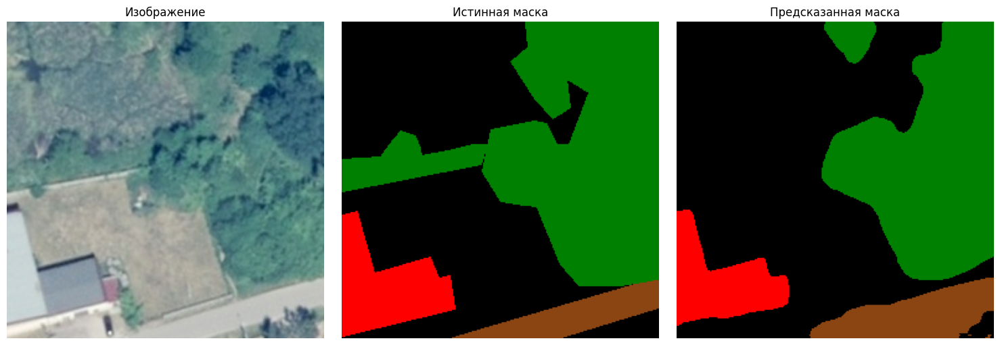

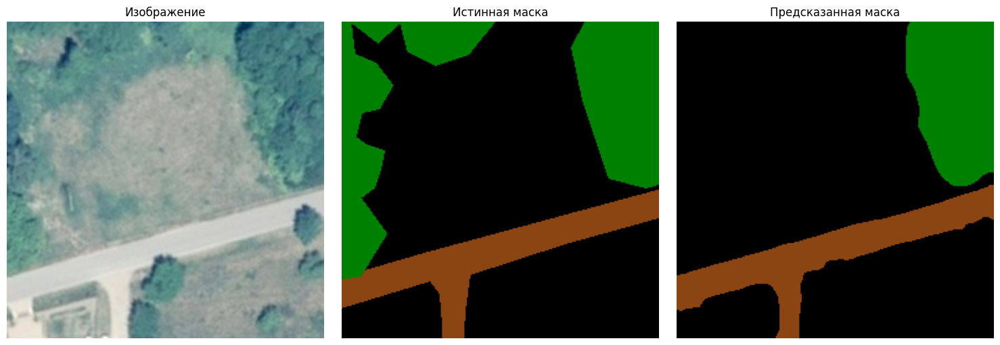

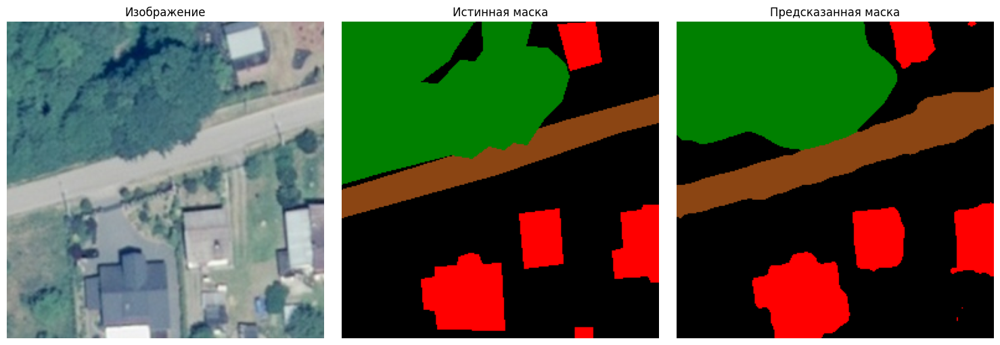

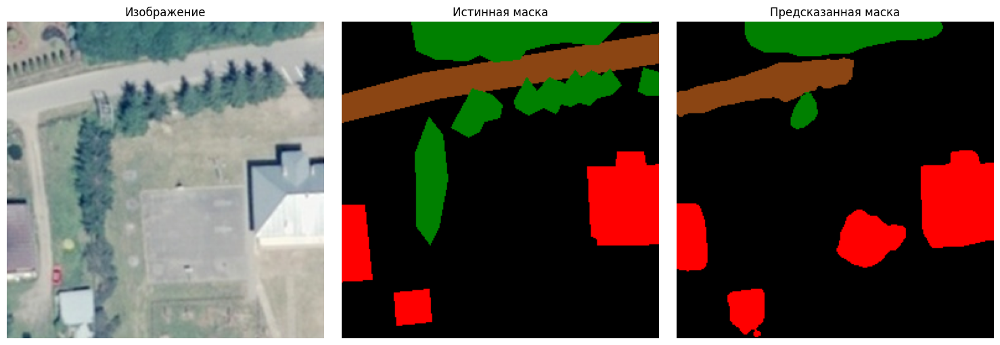

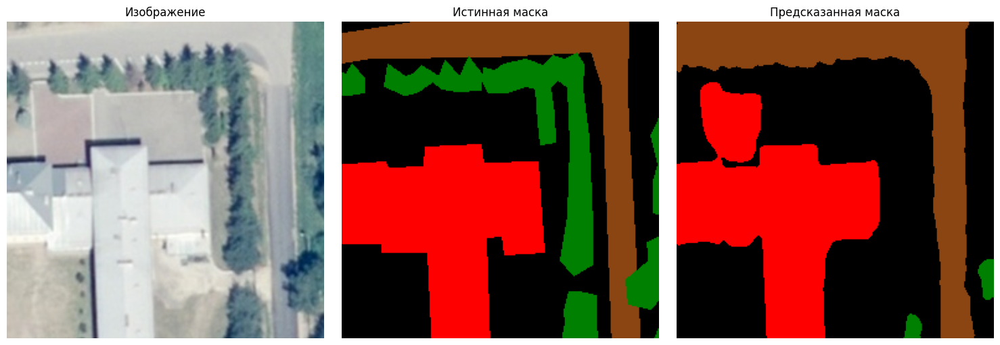

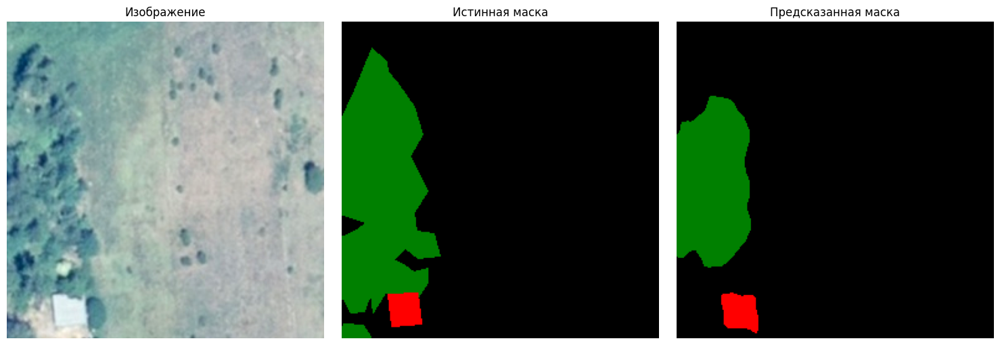

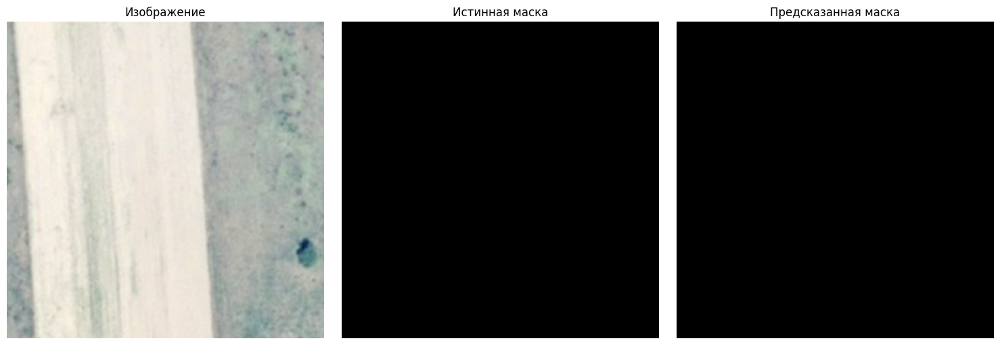

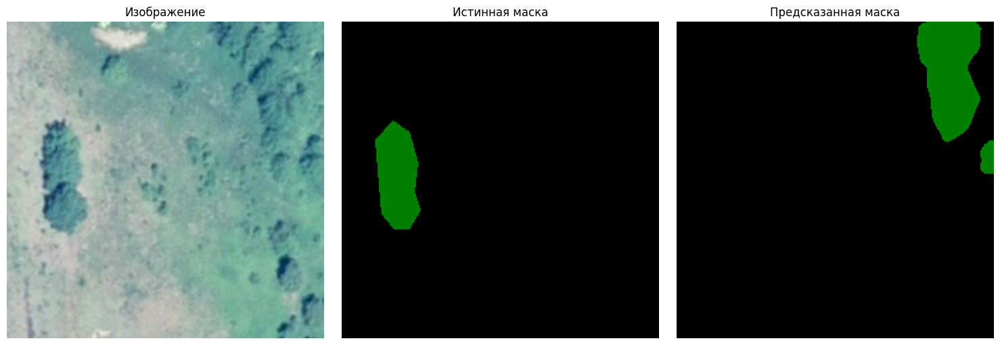

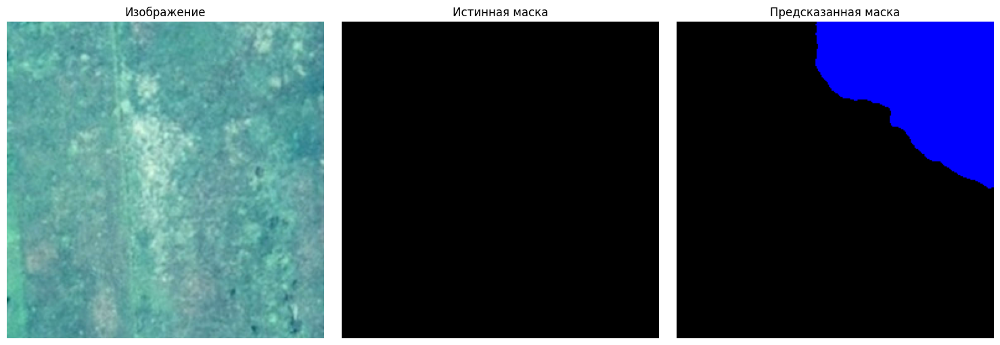

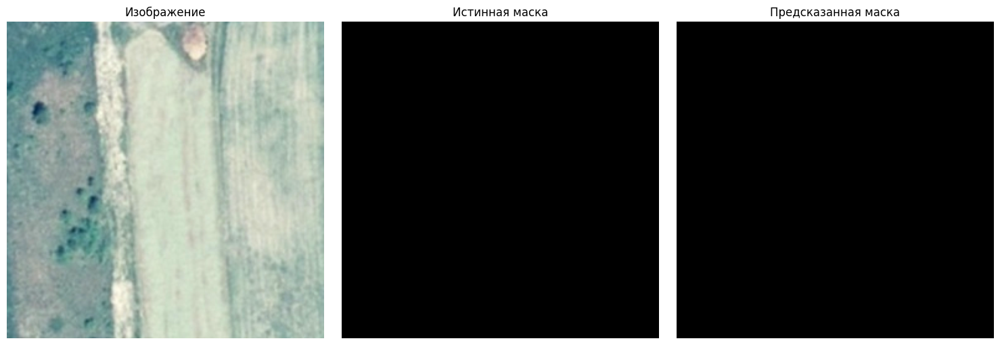

In [ ]:
model = load_model('best_model.h5', compile=False)
visualize_predictions(model, val_ds, num_samples=10)

#### **5.3. Расчёт метрик по классам**

In [ ]:
def calculate_metrics(model, dataset, class_names=CLASS_NAMES, ignore_class=None):
    """Расчёт IoU по классам, Mean IoU, Kappa Коэна и confusion matrix."""
    all_true, all_pred = [], []

    for x, y in dataset:
        pred = model.predict(x, verbose=0)
        all_true.append(np.argmax(y.numpy(), axis=-1).flatten())
        all_pred.append(np.argmax(pred, axis=-1).flatten())

    all_true = np.concatenate(all_true)
    all_pred = np.concatenate(all_pred)

    if ignore_class is not None:
        mask = (all_true != ignore_class) & (all_pred != ignore_class)
        all_true_f = all_true[mask]
        all_pred_f = all_pred[mask]
    else:
        all_true_f, all_pred_f = all_true, all_pred

    n = len(class_names)
    cm = confusion_matrix(all_true_f, all_pred_f, labels=range(n))

    print(f"\n{'='*50}")
    print("МЕТРИКИ ПО КЛАССАМ")
    print(f"{'='*50}")

    ious = []
    for i in range(n):
        tp = cm[i, i]
        fp = cm[:, i].sum() - tp
        fn = cm[i, :].sum() - tp
        iou = tp / (tp + fp + fn + 1e-8)
        ious.append(iou)
        print(f"{class_names[i]:15s}: IoU = {iou:.4f}")

    mean_iou = np.mean(ious)
    kappa = cohen_kappa_score(all_true_f, all_pred_f)

    print(f"\nMean IoU: {mean_iou:.4f}")
    print(f"Kappa:    {kappa:.4f}")

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=axes[0])
    axes[0].set_title('Confusion Matrix')
    axes[0].set_xlabel('Предсказанный класс')
    axes[0].set_ylabel('Истинный класс')

    cm_norm = confusion_matrix(all_true_f, all_pred_f, labels=range(n), normalize='true')
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=axes[1])
    axes[1].set_title('Normalized Confusion Matrix')
    axes[1].set_xlabel('Предсказанный класс')
    axes[1].set_ylabel('Истинный класс')

    plt.tight_layout()
    plt.show()

    return {'ious': dict(zip(class_names, ious)), 'mean_iou': mean_iou, 'kappa': kappa}


МЕТРИКИ ПО КЛАССАМ
background     : IoU = 0.8464
building       : IoU = 0.7771
woodland       : IoU = 0.8513
water          : IoU = 0.8093
road           : IoU = 0.5818

Mean IoU: 0.7732
Kappa:    0.8532


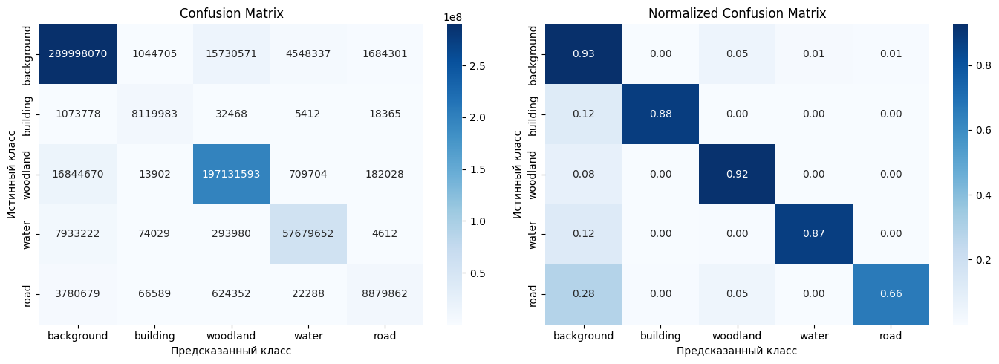

In [ ]:
metrics = calculate_metrics(model, val_ds)

### **Раздел 6. Применение модели к полноразмерным снимкам**

#### **6.1. Быстрая сегментация полноразмерного изображения**

Изображение разбивается на непересекающиеся патчи 256 x 256, для каждого выполняется предсказание, затем патчи собираются обратно в полноразмерную маску.

In [ ]:
def segment_full_image(model, image_path, patch_size=256, batch_size=32):
    """Быстрая сегментация полноразмерного изображения (без перекрытия)."""
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    orig_h, orig_w = img.shape[:2]

    # Паддинг до размера, кратного patch_size
    pad_h = (patch_size - orig_h % patch_size) % patch_size
    pad_w = (patch_size - orig_w % patch_size) % patch_size

    if pad_h > 0 or pad_w > 0:
        img = np.pad(img, ((0, pad_h), (0, pad_w), (0, 0)), mode='reflect')

    h, w = img.shape[:2]
    n_h, n_w = h // patch_size, w // patch_size

    img_tensor = tf.cast(img[None, ...], tf.float32)
    patches = tf.image.extract_patches(
        img_tensor,
        sizes=[1, patch_size, patch_size, 1],
        strides=[1, patch_size, patch_size, 1],
        rates=[1, 1, 1, 1],
        padding='VALID'
    )
    patches = tf.reshape(patches, [-1, patch_size, patch_size, 3])

    patches = preprocess_input(patches.numpy())
    preds = model.predict(patches, batch_size=batch_size, verbose=0)

    classes = np.argmax(preds, axis=-1)
    classes = classes.reshape(n_h, n_w, patch_size, patch_size)
    result = np.block([[classes[i, j] for j in range(n_w)] for i in range(n_h)])
    result = result[:orig_h, :orig_w]

    return result


def visualize_segmentation_fast(model, image_path, patch_size=256, batch_size=32):
    """Визуализирует результат быстрой сегментации."""
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    mask = segment_full_image(model, image_path, patch_size, batch_size)
    mask_rgb = label_to_rgb(mask)

    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    axes[0].imshow(img)
    axes[0].set_title("Исходное изображение")
    axes[0].axis("off")
    axes[1].imshow(mask_rgb)
    axes[1].set_title("Сегментация")
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()

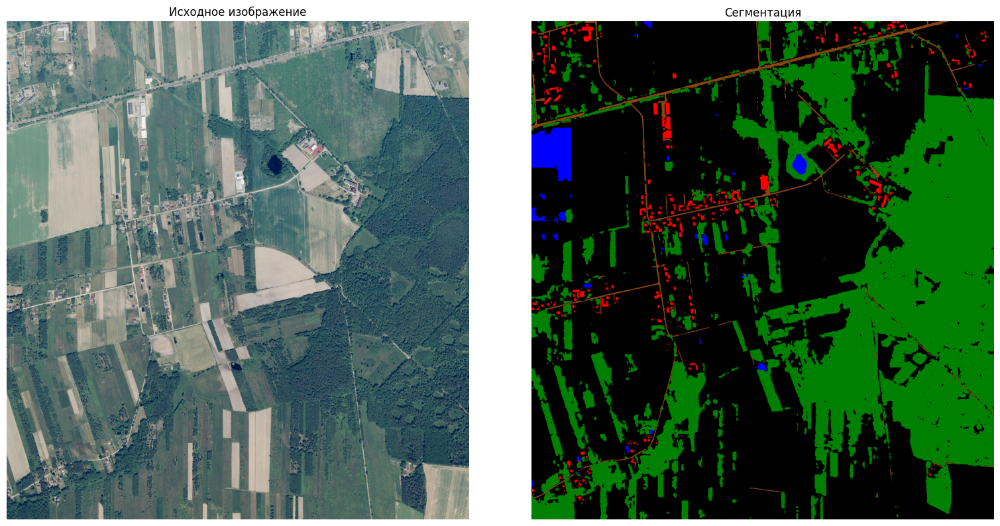

In [ ]:
visualize_segmentation_fast(model, val_img_paths[0])

#### **6.2. Сегментация с плавным смешиванием**

In [ ]:
def segment_full_image_blended(model, image_path, patch_size=256, batch_size=32, overlap=64):
    """Сегментация с перекрытием и плавным смешиванием предсказаний."""
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    height, width = img.shape[:2]

    stride = patch_size - 2 * overlap
    if stride <= 0:
        raise ValueError("Overlap слишком большой для размера патча")

    n_h = max(1, int(np.ceil((height - patch_size) / stride + 1)))
    n_w = max(1, int(np.ceil((width - patch_size) / stride + 1)))

    # Гауссово ядро весов
    y, x = np.mgrid[0:patch_size, 0:patch_size]
    center = patch_size // 2
    sigma = patch_size / 4.0
    weight_kernel = np.exp(-((x - center)**2 + (y - center)**2) / (2 * sigma**2))

    probabilities = np.zeros((height, width, N_CLASSES), dtype=np.float32)
    weights = np.zeros((height, width), dtype=np.float32)

    patches = []
    coords = []
    for i in range(n_h):
        for j in range(n_w):
            y_start = min(i * stride, height - patch_size)
            x_start = min(j * stride, width - patch_size)
            patch = img[y_start:y_start+patch_size, x_start:x_start+patch_size]
            patches.append(patch)
            coords.append((y_start, x_start))

    patches = preprocess_input(np.array(patches).astype(np.float32))
    preds = model.predict(patches, batch_size=batch_size, verbose=0)

    for (y_start, x_start), pred in zip(coords, preds):
        for c in range(N_CLASSES):
            probabilities[y_start:y_start+patch_size, x_start:x_start+patch_size, c] +=                 pred[:, :, c] * weight_kernel
        weights[y_start:y_start+patch_size, x_start:x_start+patch_size] += weight_kernel

    weights = np.maximum(weights, 1e-8)
    for c in range(N_CLASSES):
        probabilities[:, :, c] /= weights

    result = np.argmax(probabilities, axis=-1).astype(np.uint8)
    return result


def compare_blending(model, image_path):
    """Сравнение результатов с и без плавного смешивания."""
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    mask_fast = segment_full_image(model, image_path)
    mask_blended = segment_full_image_blended(model, image_path, overlap=64)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img)
    axes[0].set_title('Исходное изображение')
    axes[0].axis('off')
    axes[1].imshow(label_to_rgb(mask_fast))
    axes[1].set_title('Без смешивания (быстро)')
    axes[1].axis('off')
    axes[2].imshow(label_to_rgb(mask_blended))
    axes[2].set_title('С плавным смешиванием')
    axes[2].axis('off')
    plt.tight_layout()
    plt.show()

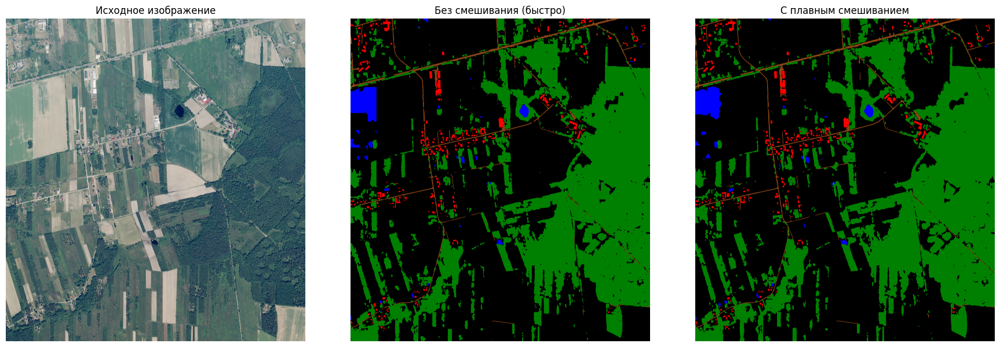

In [ ]:
compare_blending(model, val_img_paths[0])

#### **6.3. Сравнение предсказанной и оригинальной масок**

In [ ]:
def compare_segmentation(model, image_path, mask_path,
                         patch_size=256, batch_size=32, alpha=0.5,
                         seg_func=None):
    """Сравнение оригинальной и предсказанной масок с расчётом метрик."""
    if seg_func is None:
        seg_func = segment_full_image_blended

    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    mask_true = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    mask_pred = seg_func(model, image_path, patch_size, batch_size)

    h, w = mask_pred.shape[:2]
    img = img[:h, :w]
    mask_true = mask_true[:h, :w]

    mask_true_rgb = label_to_rgb(np.clip(mask_true, 0, N_CLASSES - 1))
    mask_pred_rgb = label_to_rgb(mask_pred)

    overlay_true = (img * (1 - alpha) + mask_true_rgb * alpha).astype(np.uint8)
    overlay_pred = (img * (1 - alpha) + mask_pred_rgb * alpha).astype(np.uint8)

    fig = plt.figure(figsize=(18, 14))
    gs = fig.add_gridspec(3, 6, height_ratios=[1, 1.2, 0.4], hspace=0.3)

    ax1 = fig.add_subplot(gs[0, 0:2])
    ax1.imshow(img); ax1.set_title('Исходное изображение'); ax1.axis('off')
    ax2 = fig.add_subplot(gs[0, 2:4])
    ax2.imshow(mask_true_rgb); ax2.set_title('Оригинальная маска'); ax2.axis('off')
    ax3 = fig.add_subplot(gs[0, 4:6])
    ax3.imshow(mask_pred_rgb); ax3.set_title('Предсказанная маска'); ax3.axis('off')

    ax4 = fig.add_subplot(gs[1, 0:3])
    ax4.imshow(overlay_true); ax4.set_title('Наложение оригинальной маски'); ax4.axis('off')
    ax5 = fig.add_subplot(gs[1, 3:6])
    ax5.imshow(overlay_pred); ax5.set_title('Наложение предсказанной маски'); ax5.axis('off')

    # Метрики
    y_true = mask_true.flatten()
    y_pred = mask_pred.flatten()
    y_true = np.clip(y_true, 0, N_CLASSES - 1)

    cm = confusion_matrix(y_true, y_pred, labels=range(N_CLASSES))
    ious = []
    total_inter, total_union = 0, 0
    for i in range(N_CLASSES):
        tp = cm[i, i]
        fp = cm[:, i].sum() - tp
        fn = cm[i, :].sum() - tp
        iou = tp / (tp + fp + fn + 1e-8)
        ious.append(iou)
        total_inter += tp
        total_union += tp + fp + fn

    mean_iou = np.mean(ious)
    overall_iou = total_inter / (total_union + 1e-8)
    kappa = cohen_kappa_score(y_true, y_pred)
    accuracy = np.sum(y_true == y_pred) / len(y_true)

    ax6 = fig.add_subplot(gs[2, :])
    ax6.axis('off')
    metrics_text = (
        f"Overall IoU: {overall_iou:.4f}    Mean IoU: {mean_iou:.4f}    "
        f"Kappa: {kappa:.4f}    Accuracy: {accuracy:.4f}\n\n"
    )
    metrics_text += "IoU по классам:  "
    metrics_text += "  |  ".join([f"{n}: {v:.3f}" for n, v in zip(CLASS_NAMES, ious)])
    ax6.text(0.5, 0.5, metrics_text, transform=ax6.transAxes,
             fontsize=11, ha='center', va='center',
             bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8),
             family='monospace')

    plt.tight_layout()
    plt.show()

    return {
        'ious': dict(zip(CLASS_NAMES, ious)),
        'mean_iou': mean_iou,
        'overall_iou': overall_iou,
        'kappa': kappa,
        'accuracy': accuracy
    }


========= Снимок №1 =========


C:\Users\User\AppData\Local\Temp\ipykernel_11164\631157958.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


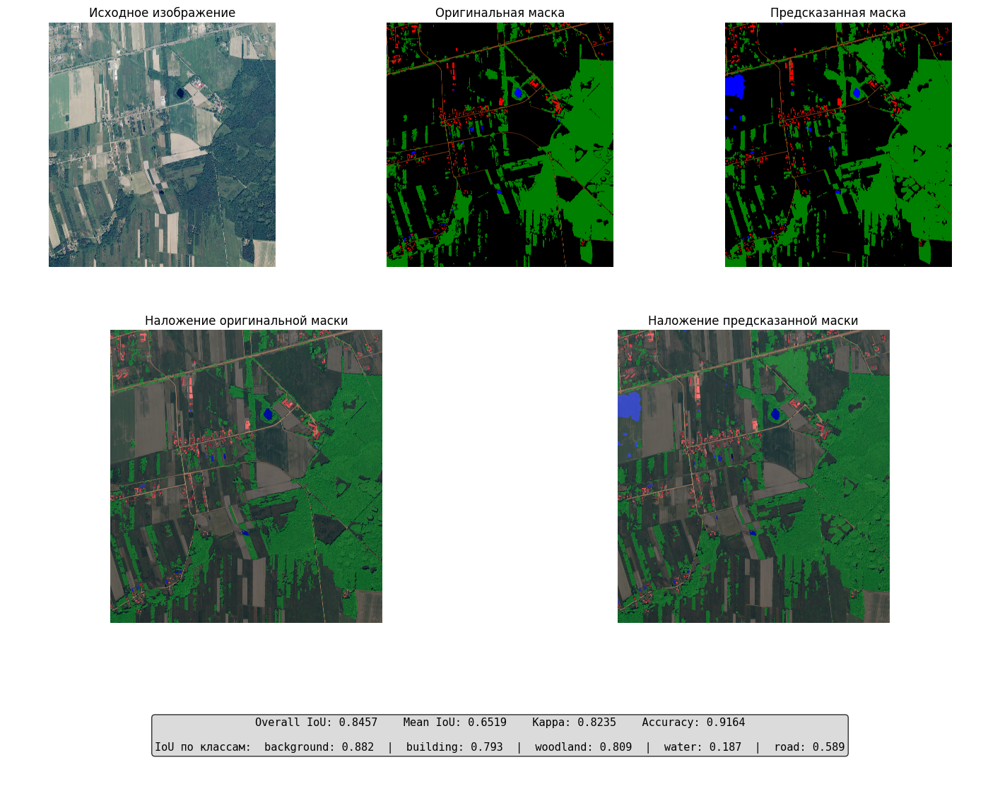


========= Снимок №2 =========


C:\Users\User\AppData\Local\Temp\ipykernel_11164\631157958.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


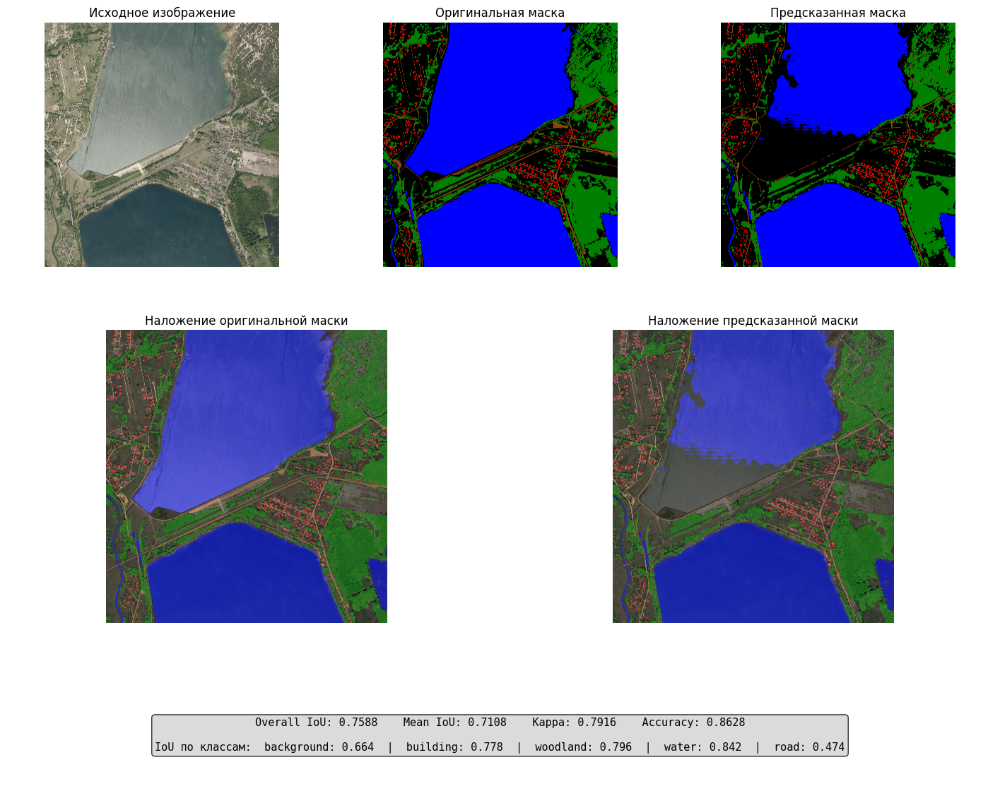


========= Снимок №3 =========


C:\Users\User\AppData\Local\Temp\ipykernel_11164\631157958.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


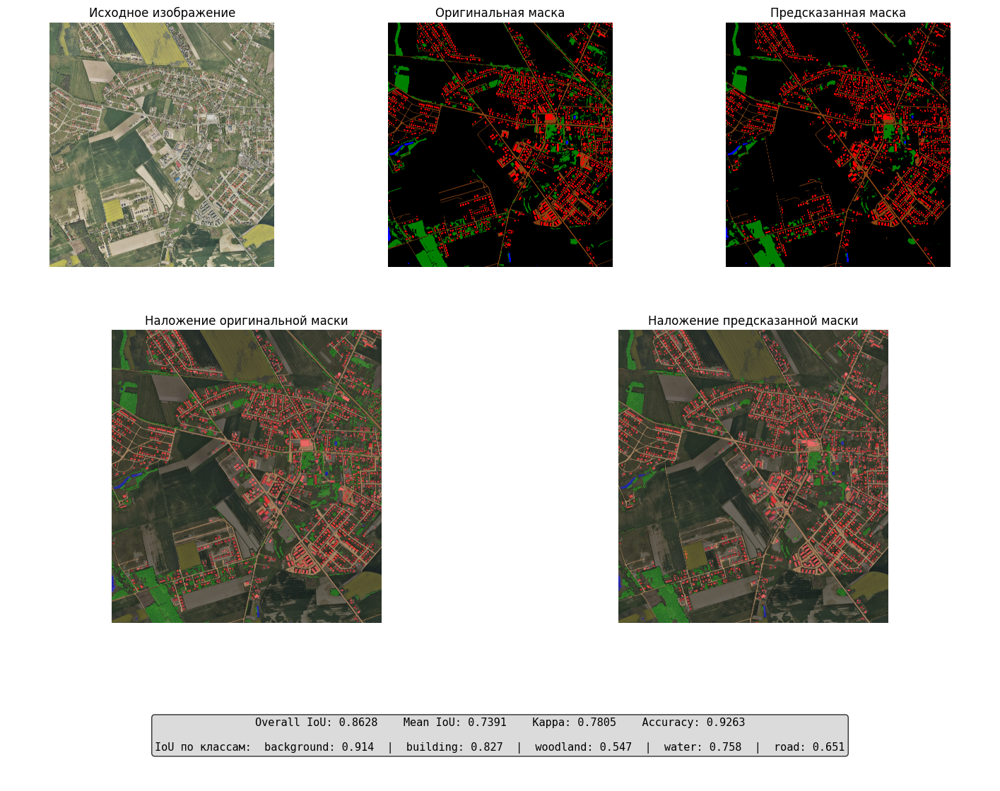

In [ ]:
# Сравнение на 3 снимках валидации
for i in range(3):
    print(f"\n========= Снимок №{i+1} =========")
    compare_segmentation(model, val_img_paths[i], val_mask_paths[i])

In [ ]:
model.save('unet_resnet34_landcover.h5')
print("Модель сохранена: unet_resnet34_landcover.h5")

Модель сохранена: unet_resnet34_landcover.h5


---

## **Задание №2. Создание и обучение собственной Unet-подобной архитектуры**

### **Пример создания модели с Unet-подобной архитектурой**

In [ ]:
from tensorflow.keras import Model, Input
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, concatenate, UpSampling2D,
                                    Dropout, Cropping2D, Softmax, Conv2DTranspose,
                                    BatchNormalization, Activation)
try:
    from tensorflow.keras.utils import plot_model
except ImportError:
    from keras.utils.vis_utils import plot_model

In [ ]:
def mini_u_net(image_shape, num_of_classes):
    """Упрощённая U-Net с 3 уровнями энкодера/декодера."""
    input_image = Input(image_shape)

    # Encoder
    conv1_1 = Conv2D(32, (3, 3), padding='same', activation='relu', name='conv1_1')(input_image)
    conv1_2 = Conv2D(32, (3, 3), padding='same', activation='relu', name='conv1_2')(conv1_1)
    pool_1 = MaxPooling2D(name='pool_1')(conv1_2)

    conv2_1 = Conv2D(64, (3, 3), padding='same', activation='relu', name='conv2_1')(pool_1)
    conv2_2 = Conv2D(64, (3, 3), padding='same', activation='relu', name='conv2_2')(conv2_1)
    pool_2 = MaxPooling2D(name='pool_2')(conv2_2)

    conv3_1 = Conv2D(128, (3, 3), padding='same', activation='relu', name='conv3_1')(pool_2)
    conv3_2 = Conv2D(128, (3, 3), padding='same', activation='relu', name='conv3_2')(conv3_1)
    pool_3 = MaxPooling2D(name='pool_3')(conv3_2)

    conv4_1 = Conv2D(256, (3, 3), padding='same', activation='relu', name='conv4_1')(pool_3)
    conv4_2 = Conv2D(256, (3, 3), padding='same', activation='relu', name='conv4_2')(conv4_1)

    # Decoder
    upconv5_1 = UpSampling2D(name='upconv5_1')(conv4_2)
    upconv5_2 = Conv2D(128, (2, 2), activation='relu', padding='same', name='upconv5_2')(upconv5_1)
    concat_5 = concatenate([upconv5_2, conv3_2], axis=3, name='concat_5')
    conv5_1 = Conv2D(128, (3, 3), padding='same', activation='relu', name='conv5_1')(concat_5)
    conv5_2 = Conv2D(128, (3, 3), padding='same', activation='relu', name='conv5_2')(conv5_1)

    upconv6_1 = UpSampling2D(name='upconv6_1')(conv5_2)
    upconv6_2 = Conv2D(64, (2, 2), activation='relu', padding='same', name='upconv6_2')(upconv6_1)
    concat_6 = concatenate([upconv6_2, conv2_2], axis=3, name='concat_6')
    conv6_1 = Conv2D(64, (3, 3), padding='same', activation='relu', name='conv6_1')(concat_6)
    conv6_2 = Conv2D(64, (3, 3), padding='same', activation='relu', name='conv6_2')(conv6_1)

    upconv7_1 = UpSampling2D(name='upconv7_1')(conv6_2)
    upconv7_2 = Conv2D(32, (2, 2), activation='relu', padding='same', name='upconv7_2')(upconv7_1)
    concat_7 = concatenate([upconv7_2, conv1_2], axis=3, name='concat_7')
    conv7_1 = Conv2D(32, (3, 3), padding='same', activation='relu', name='conv7_1')(concat_7)
    conv7_2 = Conv2D(32, (3, 3), padding='same', activation='relu', name='conv7_2')(conv7_1)

    conv8 = Conv2D(num_of_classes, (1, 1), activation='softmax', name='conv8')(conv7_2)
    model = Model(inputs=input_image, outputs=conv8, name='model')
    return model

unet_model = mini_u_net(image_shape=[256, 256, 3], num_of_classes=N_CLASSES)

### **Описание и визуализация архитектуры модели mini_u_net**

In [ ]:
unet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 256, 256, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv1_2 (Conv2D)               (None, 256, 256, 32  9248        ['conv1_1[0][0]']                
                                )                                                             

### **2.1. Создание модели с расширенной архитектурой (4 уровня)**

In [ ]:
def custom_unet(image_shape, num_of_classes):
    """
    Собственная U-Net архитектура с 4 уровнями энкодера/декодера
    и батч-нормализацией. UpSampling2D + Conv2D вместо Conv2DTranspose -
    для совместимости с TFLite.
    """
    def conv_block(x, filters, name):
        x = Conv2D(filters, (3, 3), padding='same', name=f'{name}_conv1')(x)
        x = BatchNormalization(name=f'{name}_bn1')(x)
        x = Activation('relu', name=f'{name}_relu1')(x)
        x = Conv2D(filters, (3, 3), padding='same', name=f'{name}_conv2')(x)
        x = BatchNormalization(name=f'{name}_bn2')(x)
        x = Activation('relu', name=f'{name}_relu2')(x)
        return x

    inp = Input(image_shape)

    # Encoder
    c1 = conv_block(inp, 32, 'enc1')
    p1 = MaxPooling2D(name='pool1')(c1)

    c2 = conv_block(p1, 64, 'enc2')
    p2 = MaxPooling2D(name='pool2')(c2)

    c3 = conv_block(p2, 128, 'enc3')
    p3 = MaxPooling2D(name='pool3')(c3)

    c4 = conv_block(p3, 256, 'enc4')
    p4 = MaxPooling2D(name='pool4')(c4)

    # Bottleneck
    c5 = conv_block(p4, 512, 'bottleneck')
    c5 = Dropout(0.3, name='drop_bottleneck')(c5)

    # Decoder (UpSampling2D + Conv2D вместо Conv2DTranspose для TFLite)
    u6 = UpSampling2D(name='up6')(c5)
    u6 = Conv2D(256, (2, 2), padding='same', activation='relu', name='up6_conv')(u6)
    u6 = concatenate([u6, c4], axis=3, name='concat6')
    c6 = conv_block(u6, 256, 'dec6')

    u7 = UpSampling2D(name='up7')(c6)
    u7 = Conv2D(128, (2, 2), padding='same', activation='relu', name='up7_conv')(u7)
    u7 = concatenate([u7, c3], axis=3, name='concat7')
    c7 = conv_block(u7, 128, 'dec7')

    u8 = UpSampling2D(name='up8')(c7)
    u8 = Conv2D(64, (2, 2), padding='same', activation='relu', name='up8_conv')(u8)
    u8 = concatenate([u8, c2], axis=3, name='concat8')
    c8 = conv_block(u8, 64, 'dec8')

    u9 = UpSampling2D(name='up9')(c8)
    u9 = Conv2D(32, (2, 2), padding='same', activation='relu', name='up9_conv')(u9)
    u9 = concatenate([u9, c1], axis=3, name='concat9')
    c9 = conv_block(u9, 32, 'dec9')

    out = Conv2D(num_of_classes, (1, 1), activation='softmax', name='output')(c9)

    return Model(inp, out, name='custom_unet')


model_2 = custom_unet(image_shape=[256, 256, 3], num_of_classes=N_CLASSES)
model_2.summary()

Model: "custom_unet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 enc1_conv1 (Conv2D)            (None, 256, 256, 32  896         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 enc1_bn1 (BatchNormalization)  (None, 256, 256, 32  128         ['enc1_conv1[0][0]']             
                                )                                                       

### **2.2. Обучение созданной модели с разными функциями потерь**

Проведём эксперименты с тремя разными функциями потерь из `segmentation_models`:

- **DiceLoss** - хорошо подходит для несбалансированных классов
- **JaccardLoss** - оптимизирует напрямую метрику IoU
- **DiceLoss + CategoricalFocalLoss** - комбинация, усиливающая фокус на трудно-классифицируемых пикселях

In [ ]:
# Словарь для хранения результатов разных экспериментов
experiment_histories = {}
experiment_models = {}

# Три функции потерь для сравнения
losses_to_try = {
    'DiceLoss': DiceLoss(),
    'JaccardLoss': JaccardLoss(),
    'Dice+Focal': DiceLoss() + (1 * CategoricalFocalLoss()),
}

In [ ]:
def train_custom_model(loss_name, loss_fn, epochs=30):
    """Обучает свежую копию custom_unet с указанной функцией потерь."""
    print(f"\n{'='*60}")
    print(f"Обучение с loss: {loss_name}")
    print(f"{'='*60}")

    model_custom = custom_unet(image_shape=[256, 256, 3], num_of_classes=N_CLASSES)
    model_custom.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss=loss_fn,
        metrics=['accuracy', jacard_coef]
    )

    ckpt_path = f'custom_unet_{loss_name.replace("+", "_")}.h5'
    cb = [
        EarlyStopping(monitor='val_jacard_coef', patience=8,
                     restore_best_weights=True, mode='max', verbose=1),
        ModelCheckpoint(filepath=ckpt_path, monitor='val_jacard_coef',
                       save_best_only=True, mode='max', verbose=0)
    ]

    hist = model_custom.fit(train_ds, validation_data=val_ds,
                           epochs=epochs, callbacks=cb, verbose=1)
    return model_custom, hist, ckpt_path


for loss_name, loss_fn in losses_to_try.items():
    m, h, path = train_custom_model(loss_name, loss_fn, epochs=30)
    experiment_models[loss_name] = (m, path)
    experiment_histories[loss_name] = h


Обучение с loss: DiceLoss
Epoch 1/30
1085/1085 [==============================] - 549s 487ms/step - loss: 0.5466 - accuracy: 0.7523 - jacard_coef: 0.5468 - val_loss: 0.6292 - val_accuracy: 0.6974 - val_jacard_coef: 0.5471
Epoch 2/30
1085/1085 [==============================] - 534s 482ms/step - loss: 0.4241 - accuracy: 0.8372 - jacard_coef: 0.7093 - val_loss: 0.6918 - val_accuracy: 0.5675 - val_jacard_coef: 0.4207
Epoch 3/30
1085/1085 [==============================] - 531s 479ms/step - loss: 0.3818 - accuracy: 0.8506 - jacard_coef: 0.7383 - val_loss: 0.5321 - val_accuracy: 0.7375 - val_jacard_coef: 0.6135
Epoch 4/30
1085/1085 [==============================] - 526s 474ms/step - loss: 0.3444 - accuracy: 0.8615 - jacard_coef: 0.7574 - val_loss: 0.5193 - val_accuracy: 0.7514 - val_jacard_coef: 0.6410
Epoch 5/30
1085/1085 [==============================] - 524s 473ms/step - loss: 0.3286 - accuracy: 0.8716 - jacard_coef: 0.7738 - val_loss: 0.5150 - val_accuracy: 0.7521 - val_jacard_coef: 

In [ ]:
for loss_name, h in experiment_histories.items():
    with open(f"custom_unet_{loss_name}_history.pickle", "wb") as f:
        pickle.dump(h.history, f)

Сравнение динамики обучения для разных функций потерь:

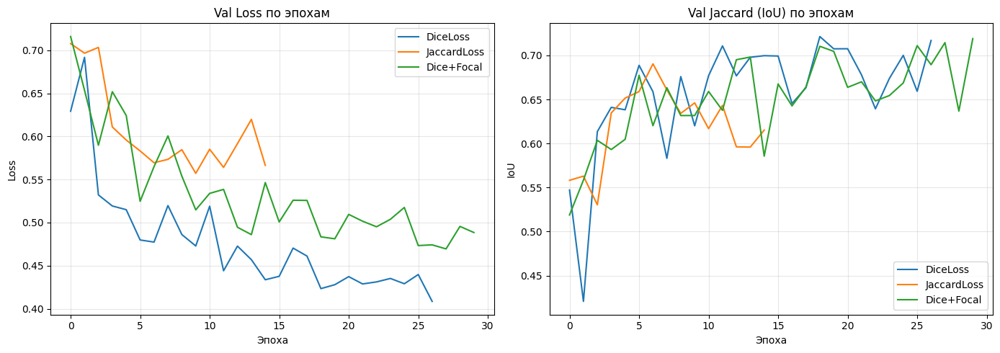


Сводная таблица экспериментов:
       loss  best_val_iou  final_val_loss  epochs
   DiceLoss      0.721426        0.408554      27
 Dice+Focal      0.719066        0.488460      30
JaccardLoss      0.690422        0.566392      15


In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for loss_name, hist in experiment_histories.items():
    axes[0].plot(hist.history['val_loss'], label=loss_name)
    axes[1].plot(hist.history['val_jacard_coef'], label=loss_name)

axes[0].set_title('Val Loss по эпохам')
axes[0].set_xlabel('Эпоха'); axes[0].set_ylabel('Loss')
axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].set_title('Val Jaccard (IoU) по эпохам')
axes[1].set_xlabel('Эпоха'); axes[1].set_ylabel('IoU')
axes[1].legend(); axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Сводная таблица финальных метрик
summary = []
for loss_name, hist in experiment_histories.items():
    summary.append({
        'loss': loss_name,
        'best_val_iou': max(hist.history['val_jacard_coef']),
        'final_val_loss': hist.history['val_loss'][-1],
        'epochs': len(hist.history['val_loss'])
    })
summary_df = pd.DataFrame(summary).sort_values('best_val_iou', ascending=False)
print("\nСводная таблица экспериментов:")
print(summary_df.to_string(index=False))

#### **2.2.1. Загрузка трёх снимков и соответствующих масок**

In [ ]:
# Берём 1 снимка из валидационной выборки (иначе оом)
test_imgs = val_img_paths[:1]
test_masks = val_mask_paths[:1]

for i, (ip, mp) in enumerate(zip(test_imgs, test_masks)):
    print(f"{i+1}. IMG: {ip}")
    print(f"   MASK: {mp}")

1. IMG: landcover.ai.v1/images\N-34-140-A-d-3-4.tif
   MASK: landcover.ai.v1/masks\N-34-140-A-d-3-4.tif


#### **2.2.2. Обработка снимков с помощью обученной модели (с плавным смешиванием)**

In [ ]:
# Загружаем лучшую модель из задания №2
best_custom_model = load_model("custom_unet_DiceLoss.h5", compile=False)

In [ ]:
# Сегментация всех трёх снимков
custom_predictions = []
for ip in test_imgs:
    pred_mask = segment_full_image(best_custom_model, ip)
    custom_predictions.append(pred_mask)
    print(f"Обработан: {os.path.basename(ip)}, размер маски: {pred_mask.shape}")

Обработан: N-34-140-A-d-3-4.tif, размер маски: (9579, 8885)


#### **2.2.3. Сравнение с моделью из Задания №1**

In [ ]:
# Загружаем модель из первого задания
task1_model = load_model('unet_resnet34_landcover.h5', compile=False)

Расчёт метрик для модели из Задания №1 (ResNet34 U-Net):

МЕТРИКИ ПО КЛАССАМ
background     : IoU = 0.8464
building       : IoU = 0.7771
woodland       : IoU = 0.8513
water          : IoU = 0.8093
road           : IoU = 0.5818

Mean IoU: 0.7732
Kappa:    0.8532


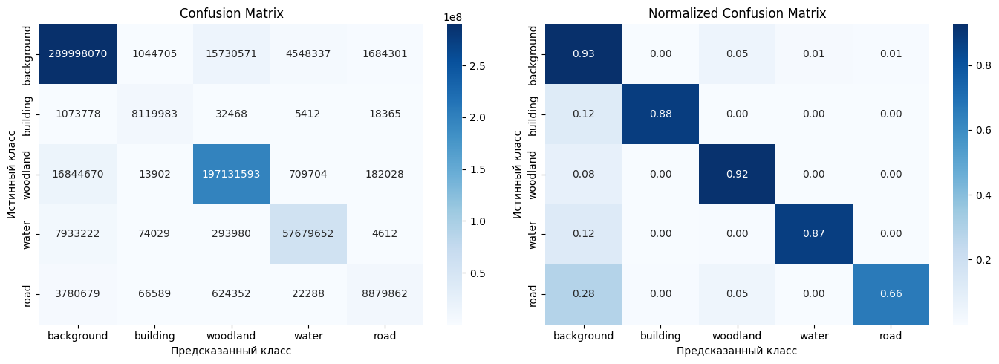

In [ ]:
print("Расчёт метрик для модели из Задания №1 (ResNet34 U-Net):")
metrics_task1 = calculate_metrics(task1_model, val_ds)


Расчёт метрик для собственной модели из Задания №2:

МЕТРИКИ ПО КЛАССАМ
background     : IoU = 0.7178
building       : IoU = 0.6733
woodland       : IoU = 0.7903
water          : IoU = 0.2767
road           : IoU = 0.4771

Mean IoU: 0.5870
Kappa:    0.6858


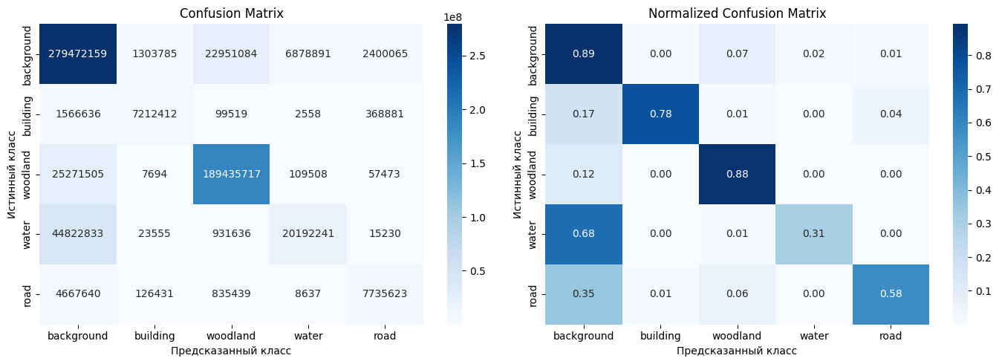

In [ ]:
print("\nРасчёт метрик для собственной модели из Задания №2:")
metrics_task2 = calculate_metrics(best_custom_model, val_ds)

In [ ]:
# Сводная таблица метрик
comparison = pd.DataFrame({
    'Задание №1 (ResNet34 U-Net)': [
        metrics_task1['ious'].get(n, 0) for n in CLASS_NAMES
    ] + [metrics_task1['mean_iou'], metrics_task1['kappa']],
    f'Задание №2 (custom_unet, {best_loss_name})': [
        metrics_task2['ious'].get(n, 0) for n in CLASS_NAMES
    ] + [metrics_task2['mean_iou'], metrics_task2['kappa']],
}, index=[f'IoU_{n}' for n in CLASS_NAMES] + ['Mean IoU', 'Kappa'])

print("Сравнение моделей:")
print(comparison.round(4).to_string())

Сравнение моделей:
                Задание №1 (ResNet34 U-Net)  Задание №2 (custom_unet, DiceLoss)
IoU_background                       0.8464                              0.7178
IoU_building                         0.7771                              0.6733
IoU_woodland                         0.8513                              0.7903
IoU_water                            0.8093                              0.2767
IoU_road                             0.5818                              0.4771
Mean IoU                             0.7732                              0.5870
Kappa                                0.8532                              0.6858


#### **2.2.4. Визуализация результатов для трёх снимков**

Для каждого снимка отображаем: исходное изображение, эталонную маску, предсказание модели из Задания №2 и предсказание модели из Задания №1.

In [ ]:
def compare_models_on_image(img_path, mask_path, model_task1, model_task2):
    """Визуальное сравнение предсказаний двух моделей на одном снимке."""
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    mask_true = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    pred_t1 = segment_full_image_blended(model_task1, img_path, overlap=64)
    pred_t2 = segment_full_image_blended(model_task2, img_path, overlap=64)

    h, w = pred_t1.shape
    img_c = img[:h, :w]
    mask_true_c = mask_true[:h, :w]

    fig, axes = plt.subplots(1, 4, figsize=(22, 6))
    axes[0].imshow(img_c); axes[0].set_title('Исходное изображение'); axes[0].axis('off')
    axes[1].imshow(label_to_rgb(np.clip(mask_true_c, 0, N_CLASSES-1)))
    axes[1].set_title('Эталонная маска'); axes[1].axis('off')
    axes[2].imshow(label_to_rgb(pred_t2))
    axes[2].set_title(f'Предсказание Задание №2\n(custom_unet, DiceLoss)')
    axes[2].axis('off')
    axes[3].imshow(label_to_rgb(pred_t1))
    axes[3].set_title('Предсказание Задание №1\n(ResNet34 U-Net)')
    axes[3].axis('off')

    plt.suptitle(f'Снимок: {os.path.basename(img_path)}', fontsize=12)
    plt.tight_layout()
    plt.show()

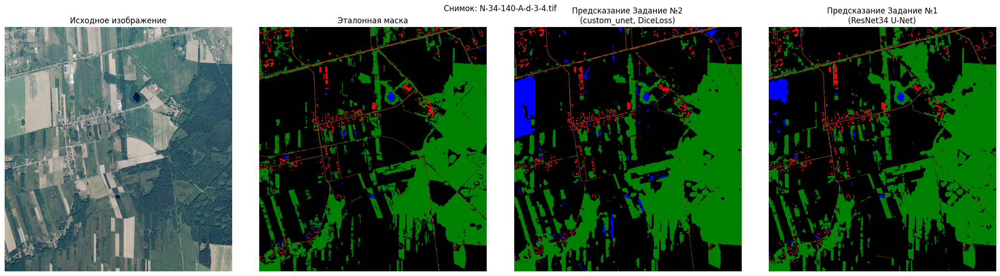

In [ ]:
for ip, mp in zip(test_imgs, test_masks):
    compare_models_on_image(ip, mp, task1_model, best_custom_model)

## **Задание №3. Реализация готового решения для полноразмерной семантической сегментации**

In [29]:

MODEL_PATH = "/content/best_model.h5"  # ← ваш путь к модели
BEST_NAME = "best_model"

import os
if not os.path.exists(MODEL_PATH):
    import glob
    files = glob.glob("/content/*.h5")
    if files:
        MODEL_PATH = files[0]
        print(f"✅ Найдена модель: {MODEL_PATH}")
    else:
        raise FileNotFoundError(f"❌ Модель не найдена")

import time
import uuid
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
import gradio as gr

print(f"🔄 Загрузка модели: {BEST_NAME}...")
BEST_MODEL = load_model(MODEL_PATH, compile=False)
print(f"✅ Модель загружена!")

IMAGENET_MEAN_BGR = np.array([103.939, 116.779, 123.68], dtype=np.float32)

def preprocess_input(x):
    """
    Предобработка как sm.get_preprocessing('resnet34').
    x: numpy array [B, H, W, 3], диапазон [0, 255], порядок каналов RGB
    """
    x = x.astype(np.float32)
    # RGB → BGR
    x = x[..., ::-1]
    # Вычитаем mean (ImageNet, BGR)
    x -= IMAGENET_MEAN_BGR
    return x
# ==============================================================================

CLASS_COLORS = np.array([
    [0,   0,   0  ],  # 0: background
    [255, 0,   0  ],  # 1: building
    [0,   128, 0  ],  # 2: woodland
    [0,   0,   255],  # 3: water
    [139, 69,  19 ],  # 4: road
], dtype=np.uint8)

CLASS_NAMES = ["background", "building", "woodland", "water", "road"]
N_CLASSES = 5

def label_to_rgb(label):
    return CLASS_COLORS[label]

def segment_full_image(model, image_path, patch_size=256, batch_size=32):
    """Сегментация полноразмерного изображения."""
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    orig_h, orig_w = img.shape[:2]

    # Паддинг до кратного patch_size
    pad_h = (patch_size - orig_h % patch_size) % patch_size
    pad_w = (patch_size - orig_w % patch_size) % patch_size
    if pad_h > 0 or pad_w > 0:
        img = np.pad(img, ((0, pad_h), (0, pad_w), (0, 0)), mode='reflect')

    h, w = img.shape[:2]
    n_h, n_w = h // patch_size, w // patch_size

    # Извлечение патчей через TensorFlow
    img_tensor = tf.cast(img[None, ...], tf.float32)
    patches = tf.image.extract_patches(
        img_tensor,
        sizes=[1, patch_size, patch_size, 1],
        strides=[1, patch_size, patch_size, 1],
        rates=[1, 1, 1, 1],
        padding='VALID'
    )
    patches = tf.reshape(patches, [-1, patch_size, patch_size, 3])

    # ←←← КЛЮЧЕВОЙ ШАГ: предобработка ←←←
    patches_np = patches.numpy()
    patches_np = preprocess_input(patches_np)

    # Предсказание
    preds = model.predict(patches_np, batch_size=batch_size, verbose=0)
    classes = np.argmax(preds, axis=-1)

    # Сборка полной маски из патчей
    classes = classes.reshape(n_h, n_w, patch_size, patch_size)
    result = np.block([[classes[i, j] for j in range(n_w)] for i in range(n_h)])
    result = result[:orig_h, :orig_w]

    return result

# ==================== ПОДГОТОВКА ====================
os.makedirs("./tmp", exist_ok=True)
os.makedirs("./results", exist_ok=True)

# ==================== ОСНОВНАЯ ФУНКЦИЯ ====================
def segment_uploaded_image(uploaded_image):
    try:
        if uploaded_image is None:
            return None, None, "Ошибка: изображение не загружено"

        tmp_id = uuid.uuid4().hex[:8]
        tmp_path = f"./tmp/input_{tmp_id}.png"

        if isinstance(uploaded_image, np.ndarray):
            if uploaded_image.dtype != np.uint8:
                uploaded_image = np.clip(uploaded_image, 0, 255).astype(np.uint8)
            ok = cv2.imwrite(tmp_path, cv2.cvtColor(uploaded_image, cv2.COLOR_RGB2BGR))
            if not ok:
                return None, None, "Ошибка сохранения"
        elif isinstance(uploaded_image, str):
            tmp_path = uploaded_image
        else:
            return None, None, f"Неизвестный тип: {type(uploaded_image)}"

        if not os.path.exists(tmp_path):
            return None, None, "Файл не найден"

        test_img = cv2.imread(tmp_path)
        if test_img is None:
            return None, None, "OpenCV не смог прочитать"

        # Сегментация
        start = time.time()
        mask = segment_full_image(BEST_MODEL, tmp_path)
        elapsed = time.time() - start

        mask_rgb = label_to_rgb(mask)

        # Сохранение
        out_path = f"./results/result_mask_{tmp_id}.png"
        ok = cv2.imwrite(out_path, cv2.cvtColor(mask_rgb, cv2.COLOR_RGB2BGR))
        if not ok:
            return None, None, "Ошибка сохранения маски"

        # Наложение
        img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
        h, w = mask_rgb.shape[:2]
        img_c = img[:h, :w]
        overlay = (img_c * 0.5 + mask_rgb * 0.5).astype(np.uint8)

        # Статистика
        unique, counts = np.unique(mask, return_counts=True)
        total = mask.size
        stats_lines = [
            f"Модель: {BEST_NAME}",
            f"Размер: {mask.shape[0]}x{mask.shape[1]}",
            f"Время: {elapsed:.2f} с",
            "",
            "Распределение классов:",
        ]
        for cls_idx, cnt in zip(unique, counts):
            pct = 100 * cnt / total
            class_name = CLASS_NAMES[int(cls_idx)]
            stats_lines.append(f"  {class_name:12s}: {pct:5.2f}%")

        return mask_rgb, overlay, "\n".join(stats_lines)

    except Exception as e:
        import traceback
        error_msg = f"❌ Ошибка: {str(e)}\n\n{traceback.format_exc()}"
        print(error_msg)
        return None, None, error_msg

# ==================== ЗАПУСК GRADIO ====================
demo = gr.Interface(
    fn=segment_uploaded_image,
    inputs=[gr.Image(type="numpy", label="📷 Загрузите снимок")],
    outputs=[
        gr.Image(type="numpy", label="🎭 Маска"),
        gr.Image(type="numpy", label="🖼️ Наложение"),
        gr.Textbox(label="📊 Статистика"),
    ],
    title="🛰️ Сегментация спутниковых снимков",
    description="LandCover.ai • U-Net • Gradio",
)

demo.launch(
    share=True,
    server_name="0.0.0.0",
    server_port=7862,
    debug=True
)

🔄 Загрузка модели: best_model...
✅ Модель загружена!
Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://a74675a04d3b945116.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


ERROR:    Exception in ASGI application
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/uvicorn/protocols/http/httptools_impl.py", line 421, in run_asgi
    result = await app(  # type: ignore[func-returns-value]
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/uvicorn/middleware/proxy_headers.py", line 56, in __call__
    return await self.app(scope, receive, send)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/fastapi/applications.py", line 1159, in __call__
    await super().__call__(scope, receive, send)
  File "/usr/local/lib/python3.12/dist-packages/starlette/applications.py", line 107, in __call__
    await self.middleware_stack(scope, receive, send)
  File "/usr/local/lib/python3.12/dist-packages/starlette/middleware/errors.py", line 186, in __call__
    raise exc
  File "/usr/local/lib/python3.12/dist-packages/starlette/middleware/error

Using existing dataset file at: .gradio/flagged/dataset1.csv
Keyboard interruption in main thread... closing server.
Killing tunnel 0.0.0.0:7862 <> https://a74675a04d3b945116.gradio.live


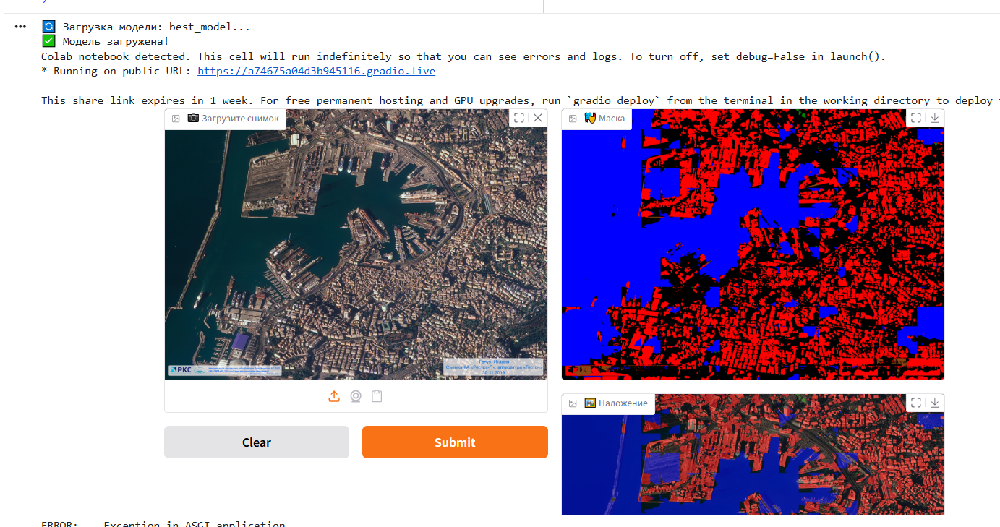

In [27]:
!pip install -q segmentation-models

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 5.7 MB/s eta 0:00:00


## **Задание №4. Обучение модели сегментации с последующим квантованием**

In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("shuvoalok/cityscapes")

print("Path to dataset files:", path)

100%|██████████| 199M/199M [00:02<00:00, 103MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/shuvoalok/cityscapes/versions/2


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

from glob import glob
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras import layers, Model

In [3]:
# пути
data_path = "/root/.cache/kagglehub/datasets/shuvoalok/cityscapes/versions/2"

train_img_path = os.path.join(data_path, "train/img")
train_mask_path = os.path.join(data_path, "train/label")

val_img_path = os.path.join(data_path, "val/img")
val_mask_path = os.path.join(data_path, "val/label")


# пары (картинка, маска)
def get_pairs(img_dir, mask_dir):
    img_paths = sorted(glob(os.path.join(img_dir, "*")))

    pairs = []
    for img_path in img_paths:
        filename = os.path.basename(img_path)
        mask_path = os.path.join(mask_dir, filename)

        if os.path.exists(mask_path):
            pairs.append((img_path, mask_path))

    return pairs


train_pairs = get_pairs(train_img_path, train_mask_path)
val_pairs = get_pairs(val_img_path, val_mask_path)

print("Train:", len(train_pairs))
print("Val:", len(val_pairs))

Train: 2975
Val: 500


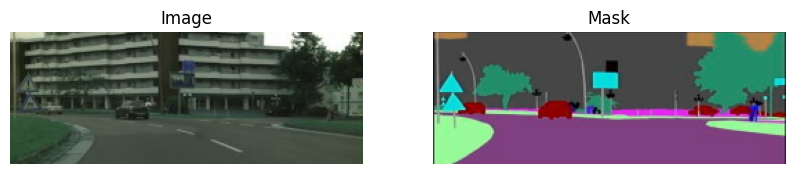

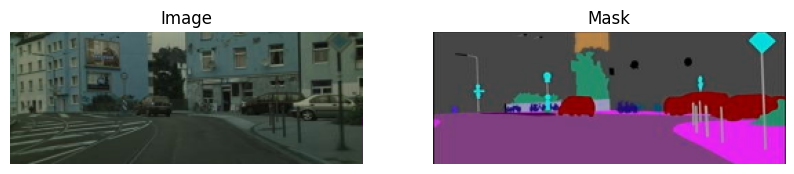

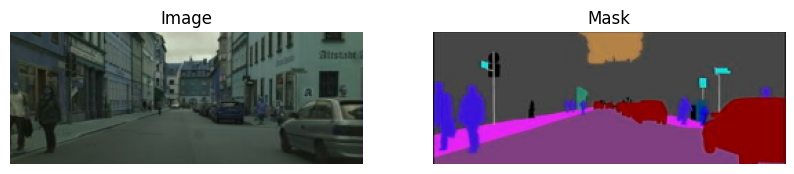

In [4]:
def show_sample(pair):
    img_path, mask_path = pair

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.title("Image")
    plt.imshow(img)
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title("Mask")
    plt.imshow(mask)
    plt.axis("off")

    plt.show()


# проверка
for i in range(3):
    show_sample(train_pairs[i])

In [5]:
from sklearn.cluster import KMeans

def extract_pixels(pairs, num_samples=10):
    pixels = []

    for i in range(num_samples):
        _, mask_path = pairs[i]

        mask = cv2.imread(mask_path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

        mask = mask.reshape(-1, 3)
        pixels.append(mask)

    return np.concatenate(pixels, axis=0)


pixels = extract_pixels(train_pairs, num_samples=10)

kmeans = KMeans(n_clusters=8, random_state=42)
kmeans.fit(pixels)

print("Cluster centers:")
print(kmeans.cluster_centers_.astype(int))

Cluster centers:
[[125  66 129]
 [ 41 139 108]
 [221  42 235]
 [ 63  63  64]
 [136 186 197]
 [134   2   4]
 [170 127  76]
 [ 67  26 203]]


In [6]:
IMG_SIZE = 256
NUM_CLASSES = 8


def preprocess_image(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img = img / 255.0
    return img


def mask_to_class(mask):
    h, w, _ = mask.shape

    reshaped = mask.reshape(-1, 3)
    labels = kmeans.predict(reshaped)

    return labels.reshape(h, w)


def preprocess_mask(mask_path):
    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)

    mask_class = mask_to_class(mask)

    mask_onehot = tf.keras.utils.to_categorical(mask_class, num_classes=NUM_CLASSES)

    return mask_onehot

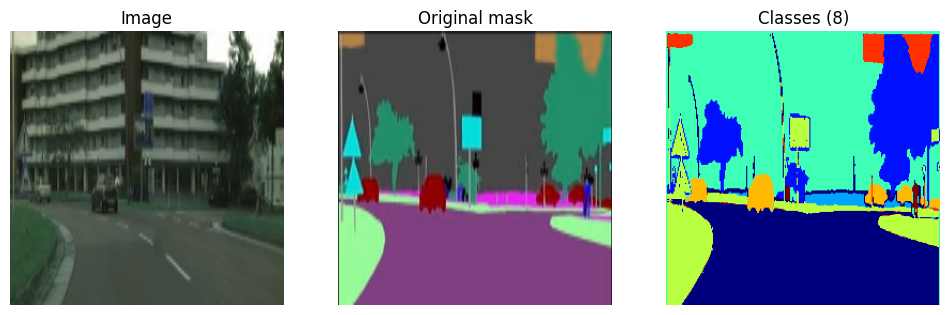

In [7]:
def show_processed(pair):
    img_path, mask_path = pair

    img = preprocess_image(img_path)

    mask_raw = cv2.imread(mask_path)
    mask_raw = cv2.cvtColor(mask_raw, cv2.COLOR_BGR2RGB)
    mask_raw = cv2.resize(mask_raw, (IMG_SIZE, IMG_SIZE))

    mask_class = mask_to_class(mask_raw)

    plt.figure(figsize=(12,5))

    plt.subplot(1,3,1)
    plt.title("Image")
    plt.imshow(img)
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.title("Original mask")
    plt.imshow(mask_raw)
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.title("Classes (8)")
    plt.imshow(mask_class, cmap="jet")
    plt.axis("off")

    plt.show()


show_processed(train_pairs[0])

In [8]:
def data_generator(pairs, batch_size=8):
    while True:
        np.random.shuffle(pairs)

        for i in range(0, len(pairs), batch_size):
            batch = pairs[i:i+batch_size]

            images = []
            masks = []

            for img_path, mask_path in batch:
                img = preprocess_image(img_path)
                mask = preprocess_mask(mask_path)

                images.append(img)
                masks.append(mask)

            yield np.array(images), np.array(masks)

In [9]:
def conv_block(x, filters):
    x = layers.Conv2D(filters, 3, padding="same", activation="relu")(x)
    x = layers.Conv2D(filters, 3, padding="same", activation="relu")(x)
    return x


def encoder_block(x, filters):
    f = conv_block(x, filters)
    p = layers.MaxPooling2D()(f)
    return f, p


def decoder_block(x, skip, filters):
    x = layers.UpSampling2D()(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x


def build_unet(input_shape=(256,256,3), num_classes=8):
    inputs = layers.Input(input_shape)

    # encoder
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    # bottleneck
    b = conv_block(p4, 1024)

    # decoder
    d1 = decoder_block(b, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = layers.Conv2D(num_classes, 1, activation="softmax")(d4)

    model = Model(inputs, outputs)
    return model


model = build_unet()
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 32, 32,    │  2,359,808 │ conv2d_6[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 16, 16,    │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 16, 16,    │  4,719,616 │ max_pooling2d_3[… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 16, 16,    │  9,438,208 │ conv2d_8[0][0]    │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 32, 32,    │          0 │ conv2d_9[0][0]    │
│ (UpSampling2D)      │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 32, 32,    │          0 │ up_sampling2d[0]

 Total params: 31,379,400 (119.70 MB)

 Trainable params: 31,379,400 (119.70 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
BATCH_SIZE = 16

train_gen = data_generator(train_pairs, BATCH_SIZE)
val_gen = data_generator(val_pairs, BATCH_SIZE)

model.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)


history = model.fit(
    train_gen,
    validation_data=val_gen,
    steps_per_epoch=len(train_pairs)//BATCH_SIZE,
    validation_steps=len(val_pairs)//BATCH_SIZE,
    epochs=25
)

Epoch 1/25
185/185 ━━━━━━━━━━━━━━━━━━━━ 286s 1s/step - accuracy: 0.5116 - loss: 4.0728 - val_accuracy: 0.6696 - val_loss: 0.9949
Epoch 2/25
185/185 ━━━━━━━━━━━━━━━━━━━━ 256s 915ms/step - accuracy: 0.6991 - loss: 0.8872 - val_accuracy: 0.7140 - val_loss: 0.8554
Epoch 3/25
185/185 ━━━━━━━━━━━━━━━━━━━━ 182s 985ms/step - accuracy: 0.7495 - loss: 0.7573 - val_accuracy: 0.7241 - val_loss: 0.8249
Epoch 4/25
185/185 ━━━━━━━━━━━━━━━━━━━━ 169s 915ms/step - accuracy: 0.7782 - loss: 0.6830 - val_accuracy: 0.7703 - val_loss: 0.7070
Epoch 5/25
185/185 ━━━━━━━━━━━━━━━━━━━━ 170s 917ms/step - accuracy: 0.7956 - loss: 0.6352 - val_accuracy: 0.7944 - val_loss: 0.6399
Epoch 6/25
185/185 ━━━━━━━━━━━━━━━━━━━━ 169s 914ms/step - accuracy: 0.8118 - loss: 0.5852 - val_accuracy: 0.8047 - val_loss: 0.6004
Epoch 7/25
185/185 ━━━━━━━━━━━━━━━━━━━━ 170s 918ms/step - accuracy: 0.8188 - loss: 0.5620 - val_accuracy: 0.8030 - val_loss: 0.6049
Epoch 8/25
185/185 ━━━━━━━━━━━━━━━━━━━━ 170s 920ms/step - accuracy: 0.8249 - lo

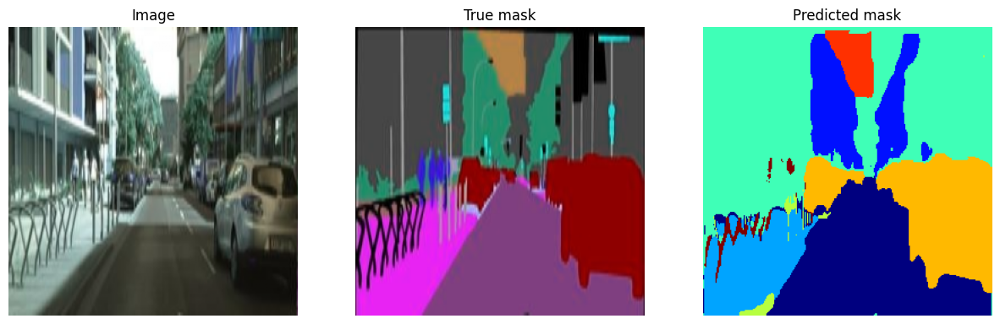

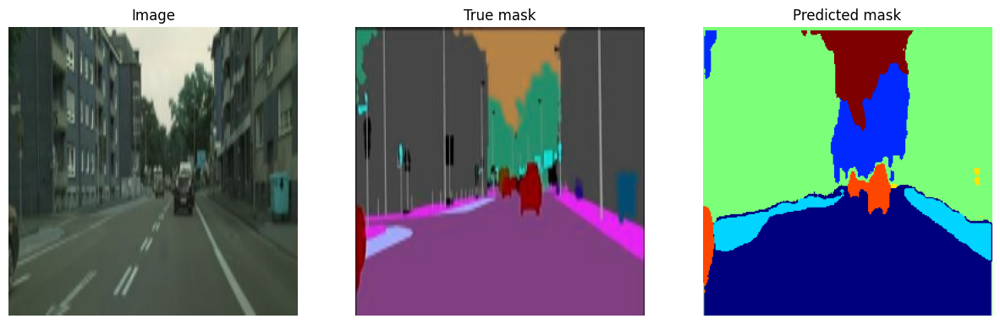

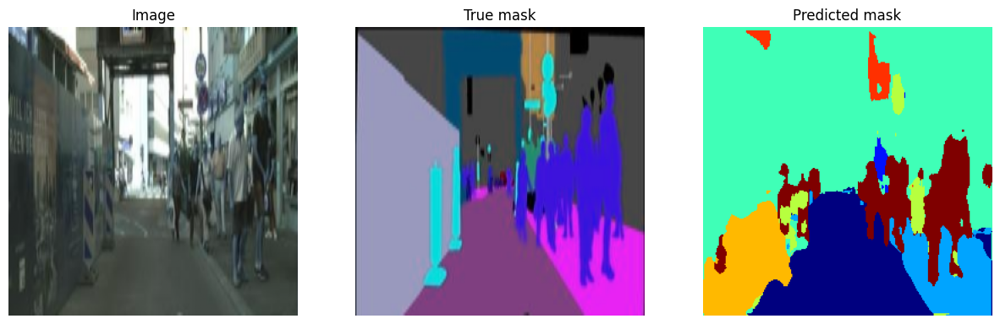

In [11]:
import random

def predict_and_visualize(model, pairs, num_samples=3):
    selected = random.sample(pairs, num_samples)

    for pair in selected:
        img_path, mask_path = pair

        # исходное изображение
        img = preprocess_image(img_path)

        # оригинальная маска (для сравнения)
        mask_true = cv2.imread(mask_path)
        mask_true = cv2.cvtColor(mask_true, cv2.COLOR_BGR2RGB)
        mask_true = cv2.resize(mask_true, (IMG_SIZE, IMG_SIZE))

        # предсказание
        pred = model.predict(np.expand_dims(img, axis=0), verbose=0)
        pred_mask = np.argmax(pred[0], axis=-1)

        plt.figure(figsize=(15,5))

        plt.subplot(1,3,1)
        plt.title("Image")
        plt.imshow(img)
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.title("True mask")
        plt.imshow(mask_true)
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.title("Predicted mask")
        plt.imshow(pred_mask, cmap="jet")
        plt.axis("off")

        plt.show()


# запуск
predict_and_visualize(model, val_pairs, num_samples=3)

In [12]:
model.save("segmentation_model.h5")
print("Модель сохранена (h5)")

Модель сохранена (h5)


In [13]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)

tflite_model = converter.convert()

with open("model.tflite", "wb") as f:
    f.write(tflite_model)

print("TFLite модель сохранена")

Saved artifact at '/tmp/tmp7xg31qhw'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 256, 256, 8), dtype=tf.float32, name=None)
Captures:
  133541815292496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815293648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815291536: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815290960: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815292880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815292304: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815292688: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815294224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815295184: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815293840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1335

In [14]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)

converter.optimizations = [tf.lite.Optimize.DEFAULT]

tflite_quant_model = converter.convert()

with open("model_quant.tflite", "wb") as f:
    f.write(tflite_quant_model)

print("Квантованная модель сохранена")

Saved artifact at '/tmp/tmppho8rq6w'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 256, 256, 8), dtype=tf.float32, name=None)
Captures:
  133541815292496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815293648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815291536: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815290960: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815292880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815292304: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815292688: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815294224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815295184: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133541815293840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1335

In [15]:
from google.colab import files

files.download("segmentation_model.h5")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [16]:
files.download("model_quant.tflite")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [17]:
import tensorflow as tf
import numpy as np
import cv2
import os
from glob import glob
import random

model = tf.keras.models.load_model("segmentation_model.h5")
IMG_SIZE = 256
train_img_path = os.path.join(path, "/root/.cache/kagglehub/datasets/shuvoalok/cityscapes/versions/2/train/img")

def representative_data_gen():
    image_paths = glob(os.path.join(train_img_path, "*"))

    for img_path in random.sample(image_paths, 100):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))

        img = img / 255.0
        img = img.astype(np.float32)

        img = np.expand_dims(img, axis=0)
        yield [img]

converter = tf.lite.TFLiteConverter.from_keras_model(model)

converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.representative_dataset = representative_data_gen

converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]

converter.inference_input_type = tf.int8
converter.inference_output_type = tf.int8

tflite_model = converter.convert()

with open("model_int8_full.tflite", "wb") as f:
    f.write(tflite_model)

print("Готово: полное INT8 квантование")

Saved artifact at '/tmp/tmpef7dlsre'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='input_layer')
Output Type:
  TensorSpec(shape=(None, 256, 256, 8), dtype=tf.float32, name=None)
Captures:
  133540341168656: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133540341168080: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133540341167120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133540341167888: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133540341166736: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133540341166928: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133540341166352: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133540341166544: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133540341165968: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133540341166160: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13354

/usr/local/lib/python3.12/dist-packages/tensorflow/lite/python/convert.py:863: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


Готово: полное INT8 квантование
